<a href="https://colab.research.google.com/github/AIJuand/AI/blob/main/Proyectoseries_Produccion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **PROYECTO** *Serie Produccion de cafe mensual*




# 1. Importanción de datos

In [ ]:
# Importación de librerias 
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import pacf
rcParams['figure.figsize'] = 15, 6
rcParams['figure.figsize'] = 15, 10
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import plotly.express as px
import plotly.graph_objects as go
import random 
import statsmodels.api as sm
import datetime as dt

#Descomposición
#from pandas import Series
import scipy as sp

#Redes neuronales
#from __future__ import print_function
#import os
#import sys
#%matplotlib inline
#import seaborn as sns
#import datetime

In [ ]:
import sys

if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")

In [ ]:
Produccion = pd.read_excel("produccion de cafe mensual (1).xlsx",header=0,
                       names=["Fecha","Produccion"])

In [ ]:
Produccion=Produccion.set_index('Fecha')

In [ ]:
Produccion_ts = Produccion['Produccion'] # Creación de la serie de tiempo 

In [ ]:
print(Produccion)

            Produccion
Fecha                 
1956-01-01   693.00000
1956-02-01   461.00000
1956-03-01   339.00000
1956-04-01   417.00000
1956-05-01   644.00000
...                ...
2022-03-01   914.00000
2022-04-01   750.00000
2022-05-01  1017.00000
2022-06-01   951.00000
2022-07-01   943.59922

[799 rows x 1 columns]


# 2. Análisis descriptivo 

* Grafico de la serie de tiempo "Producción de café mensual"



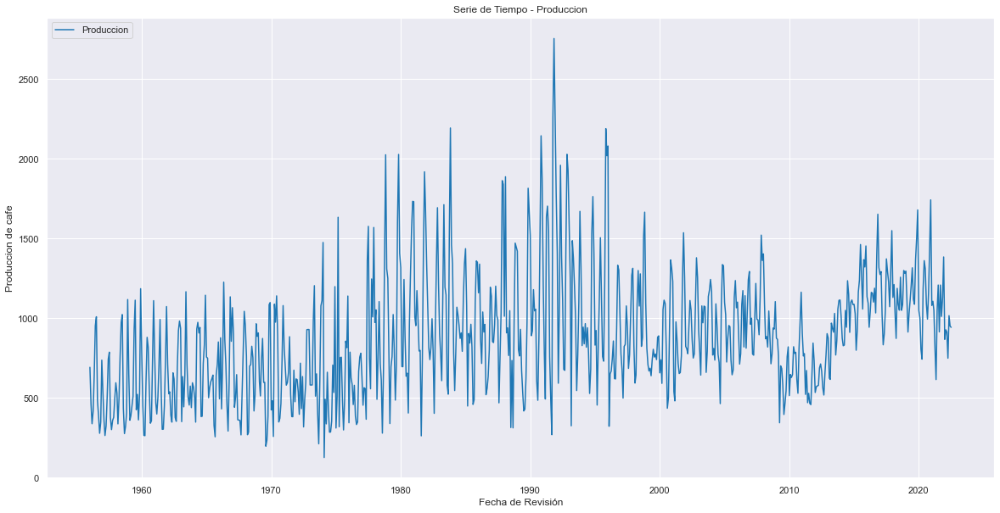

In [ ]:
plt.rc('font', size=12)
fig, ax = plt.subplots(figsize=(20, 10))
ax.plot(Produccion_ts, color = 'tab:blue', label = 'Produccion')
ax.set_xlabel('Fecha de Revisión')
ax.set_ylabel('Produccion de cafe')
ax.set_title('Serie de Tiempo - Produccion')
ax.grid(True)
ax.legend(loc='upper left');

En esta serie de tiempo "produccion de café mensual",
no es claro la presencia de una componente estacional, sin embargo podría verse algunos picos semestralmente lo que sugeriría la presencia de una componente estacional. además se sospecha de una varianza marginal (no necesariamente constante) por lo que el rango de valores se va haciendo cada vez mas grande. Es
decir, la varianza marginal va creciendo algunas veces con respecto al tiempo aumenta.

* Gráfico ACF

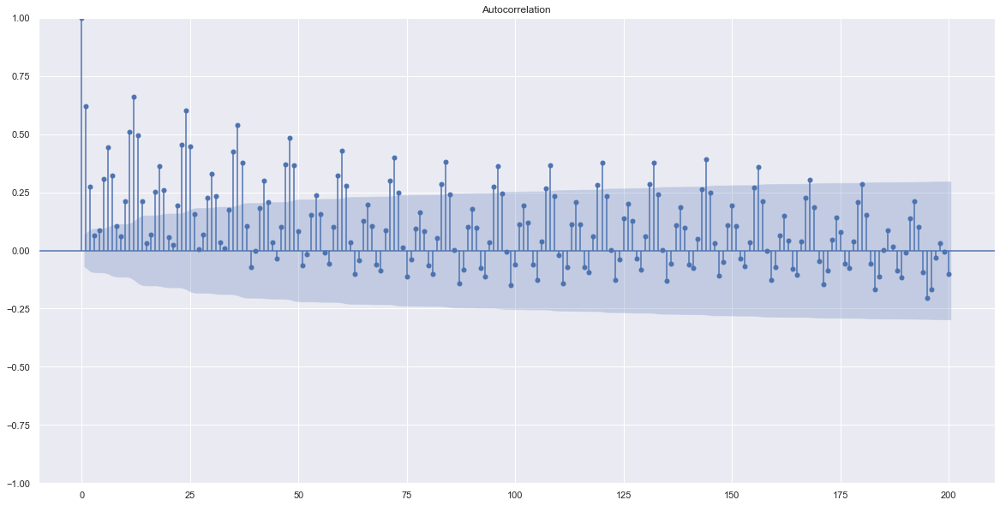

In [ ]:
rcParams['figure.figsize'] = 20,10
acfProduccion = plot_acf(Produccion_ts, lags=200, adjusted=False)
plt.show()

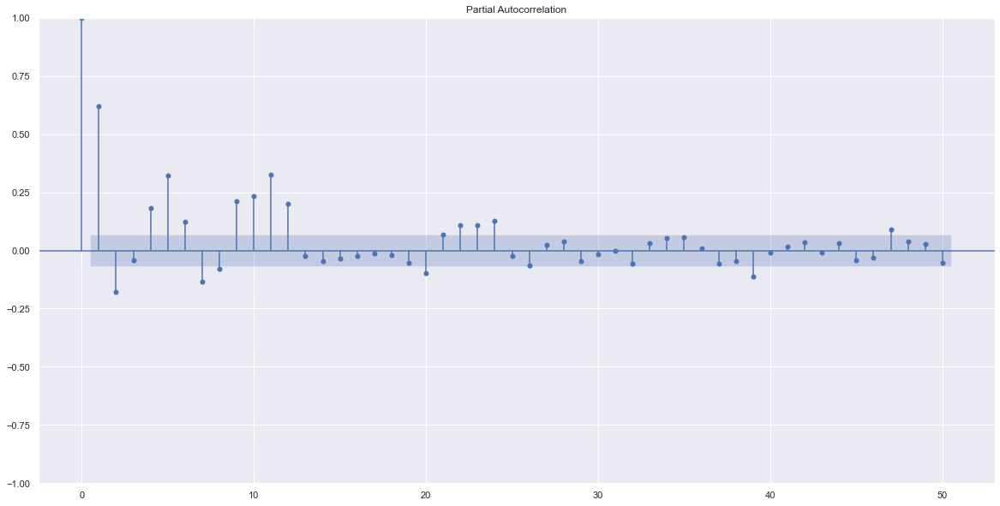

In [ ]:
rcParams['figure.figsize'] = 20,10
acfProduccion = plot_pacf(Produccion_ts, lags=50, method='ldbiased')
plt.show()

Efectivamente la serie parace no ser estacionaria, además de que como se mencionó anteriormente si hay una componente de estacionalidad sería en un periodo de cada 6 meses debido a que aunque no es muy claro hay un pico cada seis meses, es de notar que cada 12 el pico están aún mas altos.

## Gráficas de Retardos

Gráficos de dispersión para chequear que tipos de relaciones hay entre los retardos de la variable interés.

<AxesSubplot: xlabel='y(t)', ylabel='y(t + 1)'>

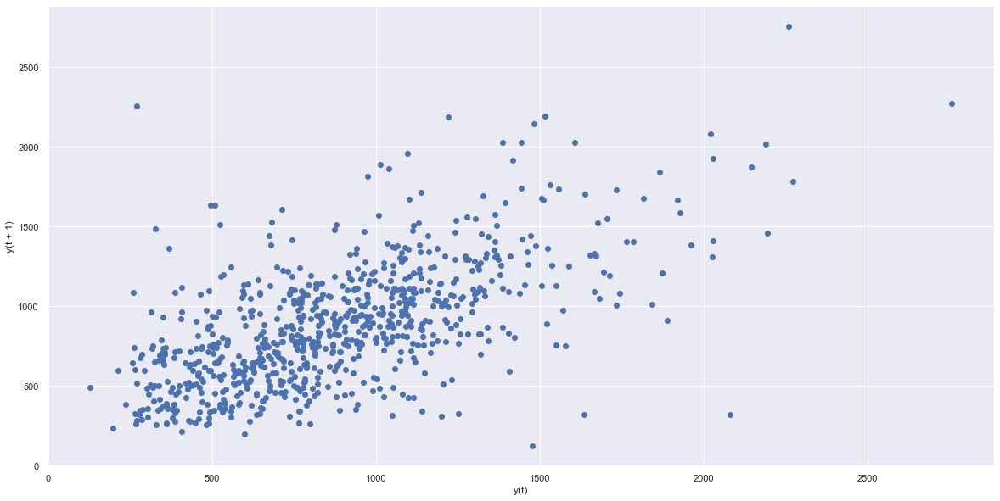

In [ ]:
pd.plotting.lag_plot(Produccion_ts, lag=1)

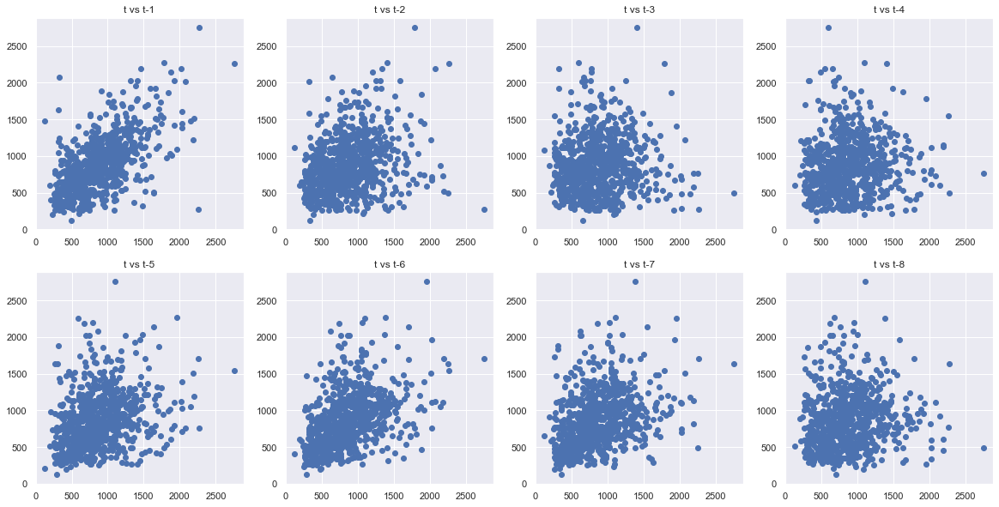

In [ ]:
from pandas.plotting import scatter_matrix
values = pd.DataFrame(Produccion_ts.values)
lags = 8
columns = [values]
for i in range(1,(lags + 1)):
	columns.append(values.shift(i))
dataframe = pd.concat(columns, axis=1)
columns = ['t']
for i in range(1,(lags + 1)):
	columns.append('t-' + str(i))
dataframe.columns = columns
plt.figure(1)
for i in range(1,(lags + 1)):
	ax = plt.subplot(240 + i)
	ax.set_title('t vs t-' + str(i))
	plt.scatter(x=dataframe['t'].values, y=dataframe['t-'+str(i)].values)
plt.show()

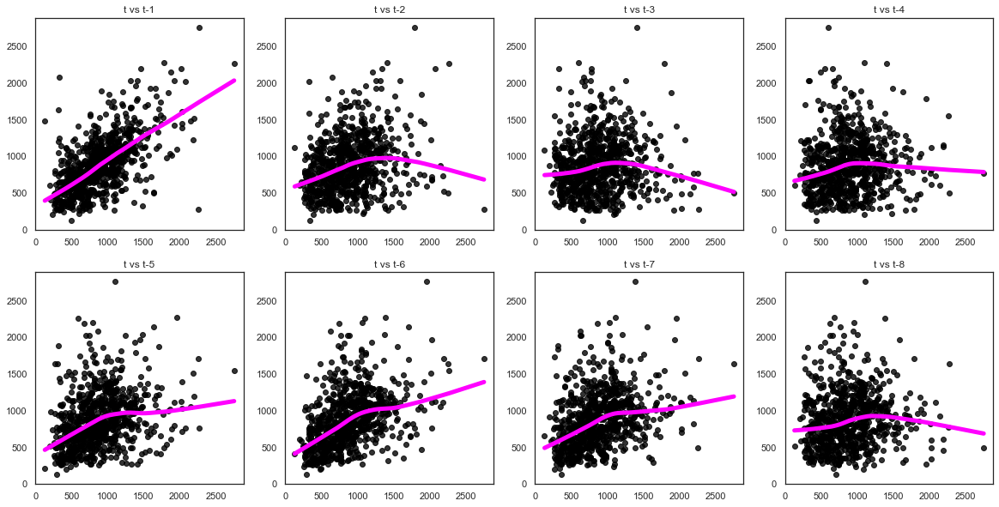

In [ ]:
import seaborn as sns
sns.set_style("white")
from pandas.plotting import scatter_matrix
values = pd.DataFrame(Produccion_ts.values)
lags = 8
columns = [values]
for i in range(1,(lags + 1)):
	columns.append(values.shift(i))
dataframe = pd.concat(columns, axis=1)
columns = ['t']
for i in range(1,(lags + 1)):
	columns.append('t-' + str(i))
dataframe.columns = columns
plt.figure(1)
for i in range(1,(lags + 1)):
	ax = plt.subplot(240 + i)
	ax.set_title('t vs t-' + str(i))
	sns.regplot(x=dataframe['t'].values, y=dataframe['t-'+str(i)].values,color="black",lowess=True, 
            line_kws={"color":"magenta", "linewidth":5})
plt.show()

# 3. BOX-COX

La transformación BOX-COX para estabilizar la varianza (marginal) a través de un λ.

In [ ]:
#####Transformación Box-Cox
import scipy as sp
sp.stats.boxcox(Produccion['Produccion'],alpha=0.05)

(array([25.69082712, 21.86702115, 19.32640139, 21.00745491, 24.9617261 ,
        29.09884002, 29.74852473, 22.29531973, 20.38716125, 17.85352158,
        19.55504446, 26.33157682, 23.28577848, 19.80170865, 17.48087578,
        18.99885016, 22.63930407, 26.4150821 , 27.01453598, 20.19503308,
        18.44030754, 19.77948782, 20.2165258 , 22.47743151, 24.21182457,
        23.14848747, 19.30329831, 22.62141123, 26.64933967, 29.33363433,
        29.9072861 , 21.34621128, 17.80103862, 18.92747844, 20.80399585,
        30.93851507, 25.0982685 , 19.82388958, 20.42946292, 21.65728602,
        22.78162516, 28.86083955, 30.8958005 , 21.2077817 , 22.99242918,
        19.8681325 , 23.06200117, 31.65001106, 26.93408925, 21.63805543,
        17.50790992, 17.45377557, 24.30765007, 28.21375814, 27.43702731,
        23.5732129 , 19.39544723, 19.73492575, 26.38729557, 30.86369943,
        26.71759377, 22.03622725, 20.65964273, 22.63930407, 25.87863044,
        29.55381739, 23.55646334, 18.48994689, 18.5

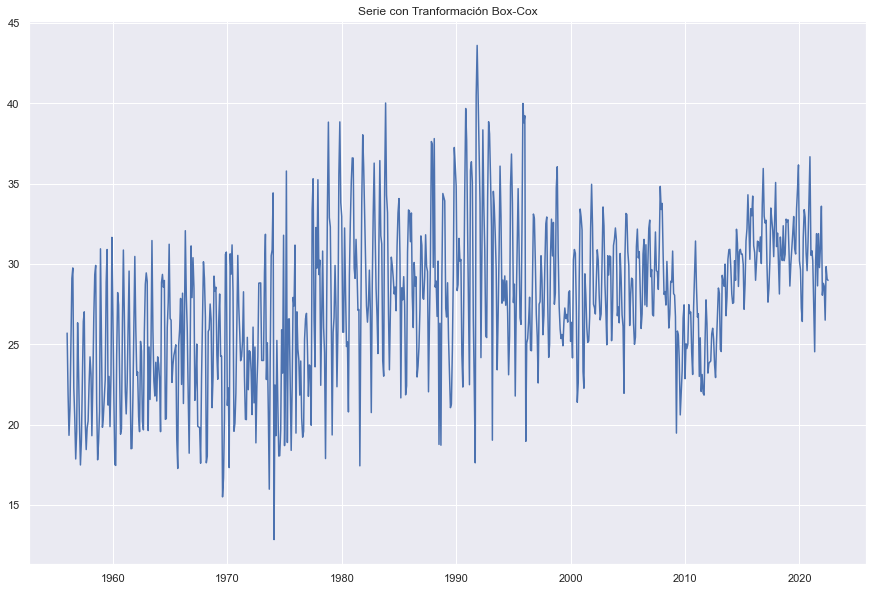

In [ ]:
box=sp.stats.boxcox(Produccion['Produccion'],lmbda= 0.3531163186031495)
data = Produccion.assign(box=box)  

box_produccionts= data['box'] 
plt.plot(box_produccionts)
plt.title('Serie con Tranformación Box-Cox') 
plt.show() 

In [ ]:
sp.stats.boxcox(box_produccionts,alpha=0.05)
#-----No hay necesidad de hacer otro box-cox

(array([24.51677505, 20.72885192, 18.21100041, 19.87709169, 23.79465373,
        27.89138048, 28.53455858, 21.15322352, 19.26236693, 16.75087628,
        18.43763297, 25.15134042, 22.1345088 , 18.68211937, 16.38140202,
        17.88631545, 21.49403635, 25.23403633, 25.82765729, 19.07195243,
        17.33262184, 18.6600951 , 19.09325372, 21.33365819, 23.0518655 ,
        21.99849689, 18.18810003, 21.47630887, 25.46601921, 28.12382819,
        28.69172356, 20.21278386, 16.69884139, 17.81556607, 19.67546529,
        29.71252336, 23.92989373, 18.70410402, 19.30429057, 20.52103081,
        21.63504074, 27.65575294, 29.67024282, 20.07560837, 21.84388965,
        18.74795521, 21.91281514, 30.41676451, 25.74799563, 20.50197542,
        16.40820685, 16.35453154, 23.1467858 , 27.01509373, 26.246014  ,
        22.41925756, 18.27943995, 18.615927  , 25.2065192 , 29.6384678 ,
        25.53360939, 20.89650953, 19.53240887, 21.49403635, 24.70277058,
        28.34180566, 22.40266478, 17.38183224, 17.4

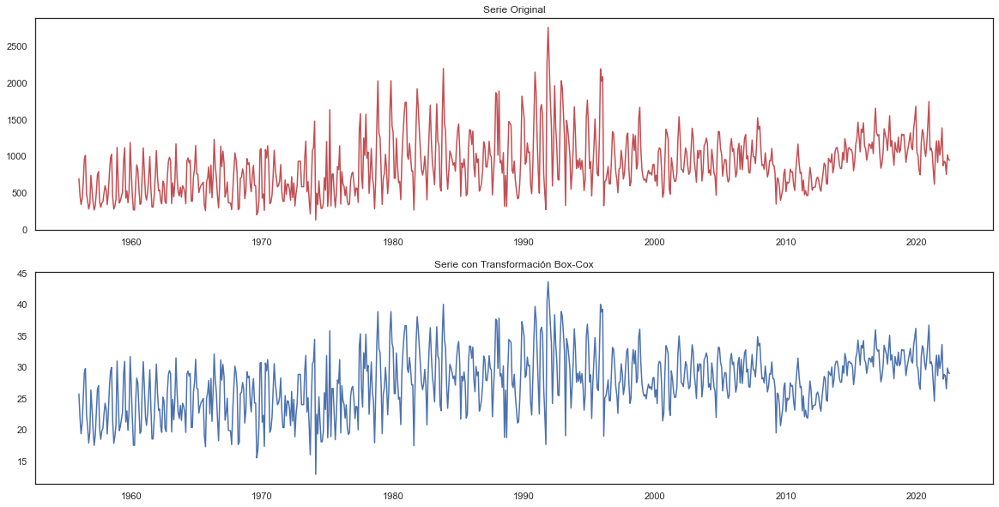

In [ ]:
fig, ax = plt.subplots(2,1,figsize=(20,10)) 
ax[0].plot(Produccion_ts,color='r')
ax[0].title.set_text('Serie Original')
ax[1].plot(box_produccionts)
ax[1].title.set_text('Serie con Transformación Box-Cox')
plt.show()

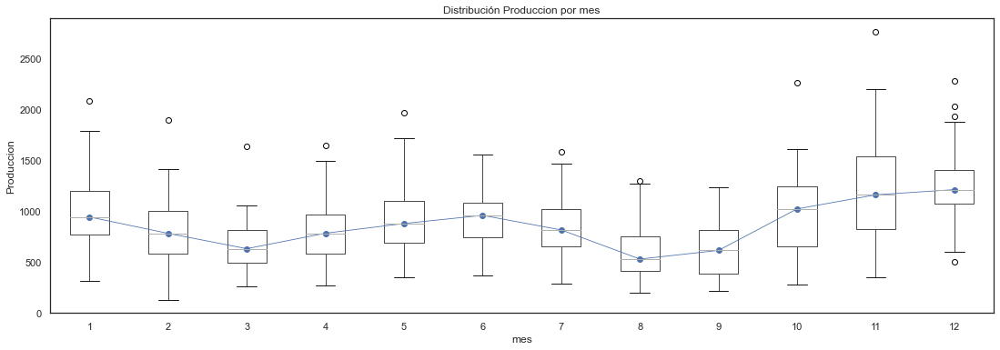

In [ ]:
# ==============================================================================
fig, ax = plt.subplots(figsize=(18, 6))
Produccion['mes'] = Produccion.index.month
Produccion.boxplot(column='Produccion', by='mes', ax=ax,)
Produccion.groupby('mes')['Produccion'].median().plot(style='o-', linewidth=0.8, ax=ax)
ax.set_ylabel('Produccion')
ax.set_title('Distribución Produccion por mes')
fig.suptitle('');

* Periodograma

133
0.16645807259073842


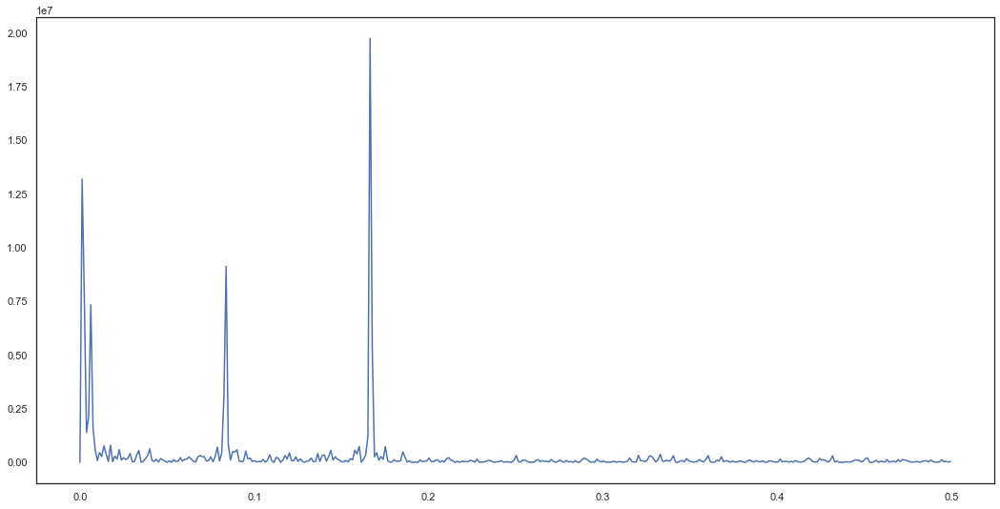

In [ ]:
# Analísis de periodicidad de la serie temporal
f, Pxx_den=sp.signal.periodogram(Produccion["Produccion"])
plt.figure(figsize=(18, 9))
plt.plot(f, Pxx_den)
#plt.axvline(x=1/3360,color='blue')
max_index_value = np.argmax(Pxx_den, axis=0)
print(max_index_value)
frecuencia_max=f[max_index_value]
print(frecuencia_max)

133
0.16645807259073842


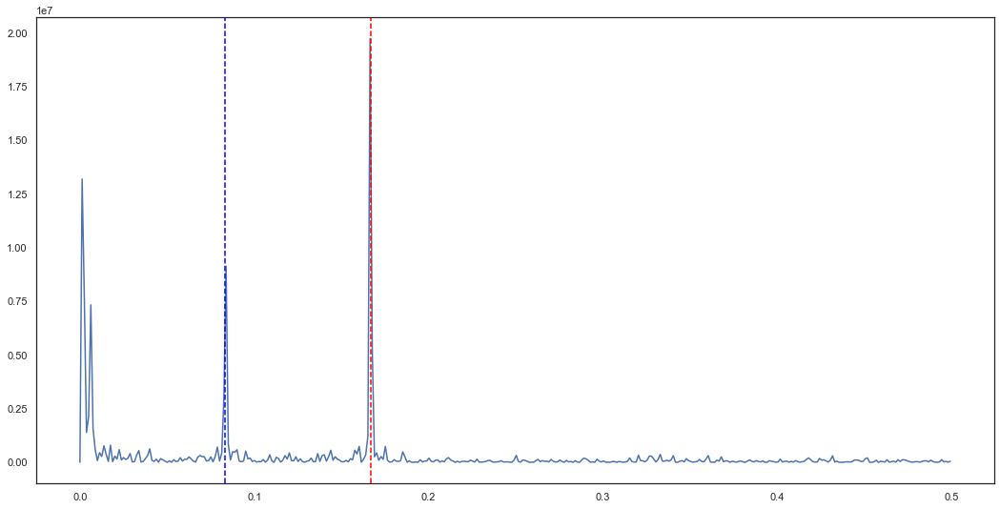

In [ ]:
# Analísis de periodicidad de la serie temporal
f, Pxx_den=sp.signal.periodogram(Produccion["Produccion"])
plt.figure(figsize=(18, 9))
plt.plot(f, Pxx_den)
plt.axvline(x=1/6,ls='--',color='red') # Posible ciclo semestral
plt.axvline(x=1/12,ls='--',color='blue') # Posible ciclo anual
#plt.axvline(x=1/3360,color='blue')
max_index_value = np.argmax(Pxx_den, axis=0)
print(max_index_value)
frecuencia_max=f[max_index_value]
print(frecuencia_max)

Componente estacional mas fuerte en s=6

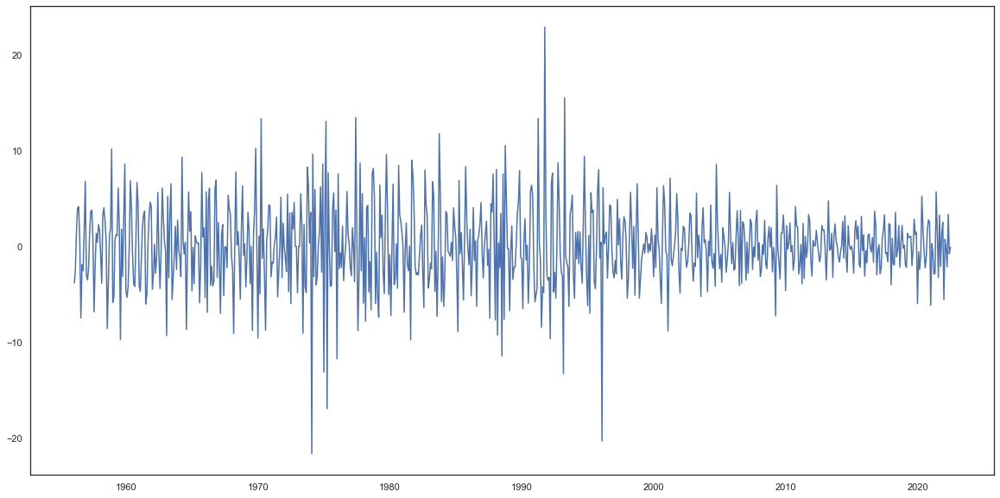

In [ ]:
#box-cox diferenciada
dif_Produccion_BX=box_produccionts.diff(periods=1)
fig, ax = plt.subplots(figsize=(20, 10))
ax.plot(dif_Produccion_BX, '-', label="Serie BOX-COX Diferenciada")

Comentar

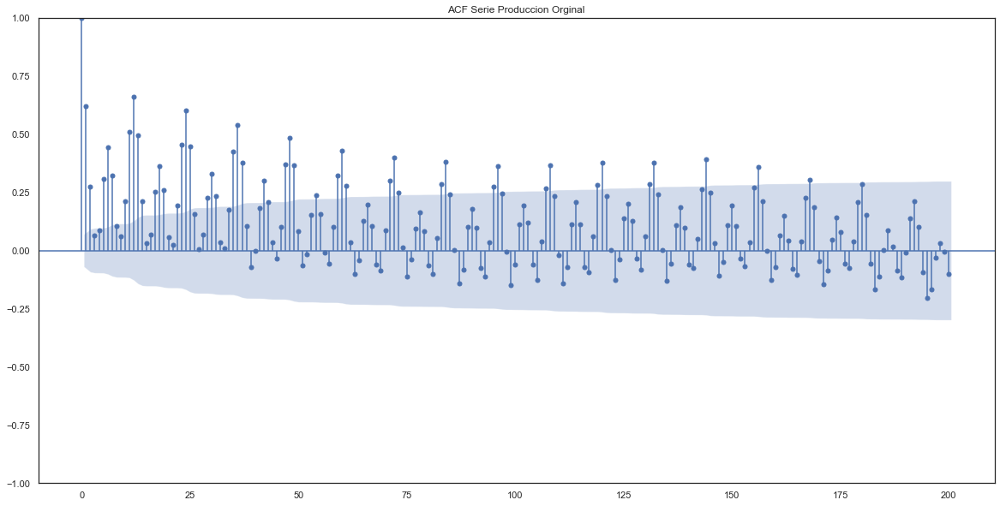

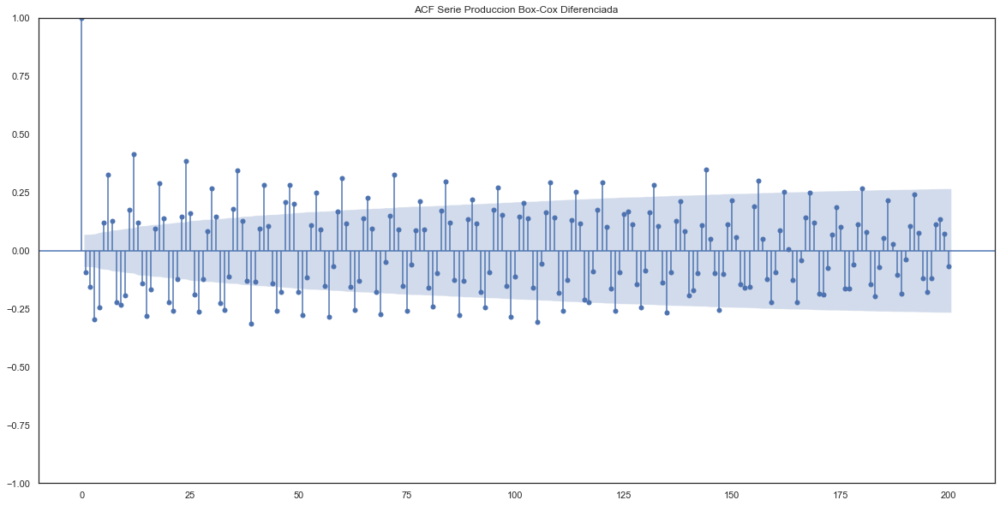

In [ ]:
a=plot_acf(Produccion_ts,adjusted=False,lags=200,title='ACF Serie Produccion Orginal') #-Original
b=plot_acf(dif_Produccion_BX.dropna(),adjusted=False,lags=200,title='ACF Serie Produccion Box-Cox Diferenciada') #-BOC-COX Diferenciada

Con el ACF de la serie diferenciada es mucho más claro que la componente estacional se encuentra cada 6 meses.

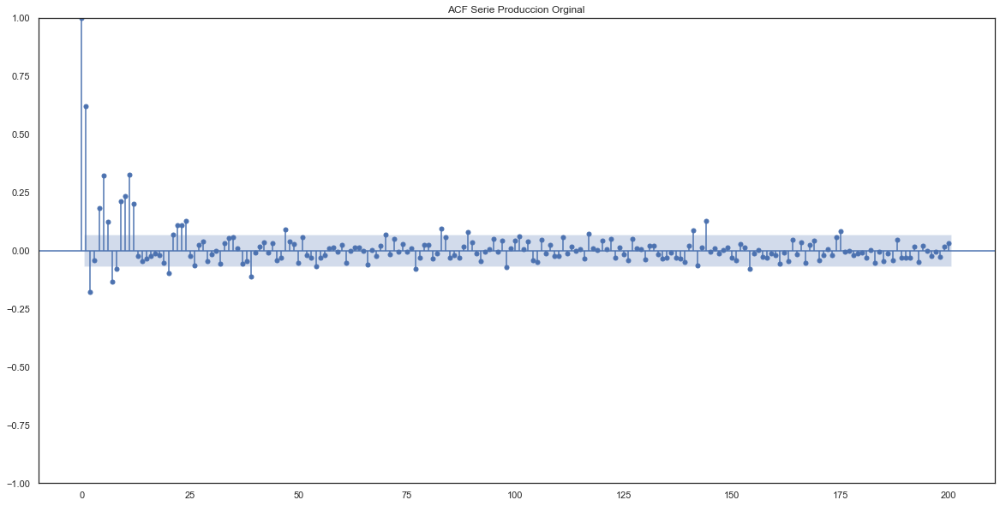

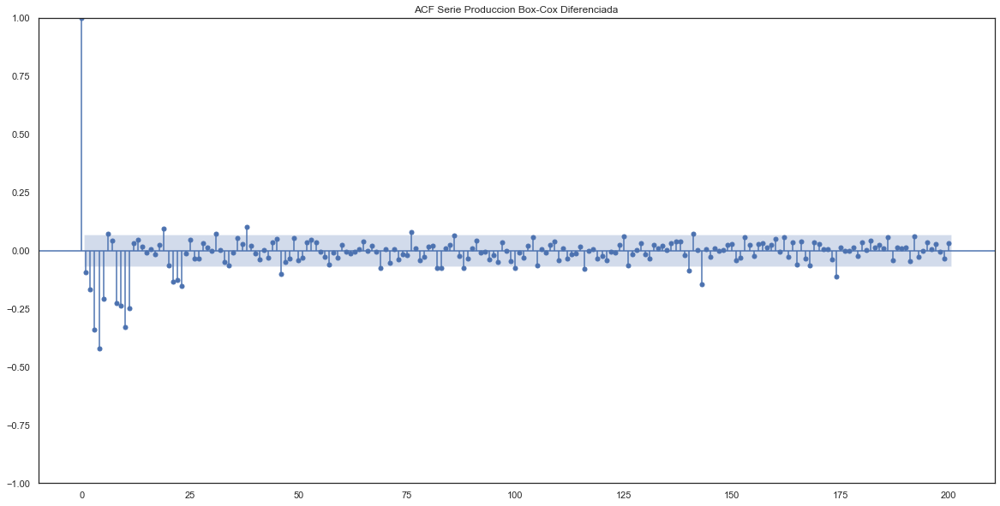

In [ ]:
a=plot_pacf(Produccion_ts,method='ldbiased',lags=200,title='ACF Serie Produccion Orginal') #-Original
b=plot_pacf(dif_Produccion_BX.dropna(),method='ldbiased',lags=200,title='ACF Serie Produccion Box-Cox Diferenciada') #-BOC-COX Diferenciada

# 4.MODELOS

## - Suavizamiento Exponencial -

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [ ]:
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt  # Importación para suavizamiento exponencial
X = box_produccionts.values
size = int(len(X) * 0.8)
train, test = X[1:size], X[size:len(X)]
modelo = ExponentialSmoothing(train,seasonal_periods = 12, trend = 'add',seasonal = 'add', initialization_method = "estimated", use_boxcox=False).fit() 
modelo.params_formatted

,name,param,optimized
smoothing_level,alpha,0.078057,True
smoothing_trend,beta,0.000000,True
smoothing_seasonal,gamma,0.154787,True
initial_level,l.0,22.879039,True
initial_trend,b.0,0.009454,True
initial_seasons.0,s.0,-1.399933,True
initial_seasons.1,s.1,-3.596838,True
initial_seasons.2,s.2,-2.001671,True
initial_seasons.3,s.3,0.998511,True
initial_seasons.4,s.4,4.011642,True


In [ ]:
## Rolling

X = box_produccionts.values
size = int(len(X) * 0.8)
train, test = X[1:size], X[size:len(X)]
history = [x for x in train]
predicciones = list()
for t in range(len(test)):
	modelo = ExponentialSmoothing(history,seasonal_periods = 12, trend = 'add',seasonal = 'add' ,initialization_method = "estimated", use_boxcox=False).fit(smoothing_level=0.078057,smoothing_trend=0.000000)  
	output = modelo.forecast()
	yhat = output[0]
	predicciones.append(yhat)
	obs = test[t]
	history.append(obs)
	#print('Predicción=%f, Esperado=%f' % (yhat, obs))
error = mean_squared_error(test, predicciones)
print(error)

4.593071646017992


In [ ]:
train=sp.special.inv_boxcox(np.array(train[0:]),0.3531163186031495)
test=sp.special.inv_boxcox(np.array(test[0:]),0.3531163186031495)
predicciones=sp.special.inv_boxcox(np.array(predicciones[0:]),0.3531163186031495)

In [ ]:
#Error cuadratico medio escala original
errorR = mean_squared_error(test, predicciones)
print(errorR)
import statistics as stats
stats.mean((test - predicciones)**2)

29513.593655079498


29513.593655079498

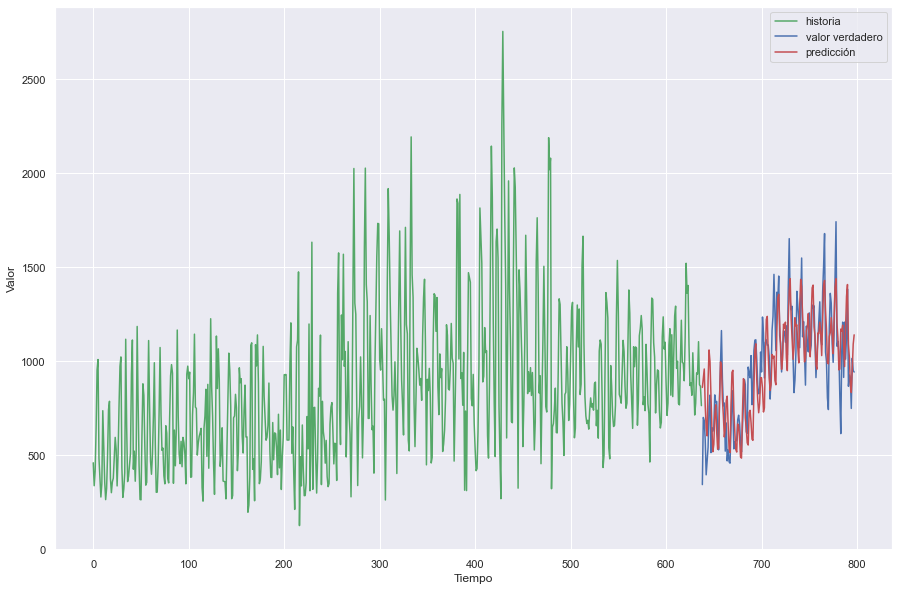

In [ ]:
plt.plot(np.arange(0, len(train)), train, 'g', label="historia")
plt.plot(np.arange(len(train), len(train) + len(test)), test, label="valor verdadero")
plt.plot(np.arange(len(train), len(train) + len(test)), predicciones, 'r', label="predicción")
plt.ylabel('Valor')
plt.xlabel('Tiempo')
plt.legend()
plt.show();

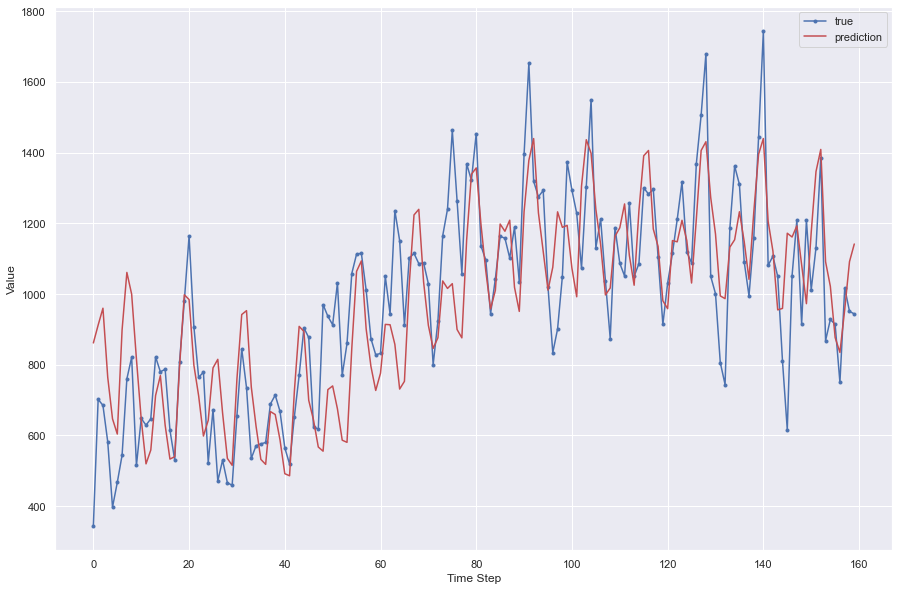

In [ ]:
plt.plot(test, marker='.', label="true")
plt.plot(predicciones, 'r', label="prediction")
plt.ylabel('Value')
plt.xlabel('Time Step')
plt.legend()
plt.show();

## - SARIMA -

In [ ]:
resultadoadf=adfuller(train,regression="nc",autolag=None, maxlag=1)
print('ADF Statistic: %f' % resultadoadf[0])
print('P-value: %f' % resultadoadf[1])
for key, value in resultadoadf[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -4.719032
P-value: 0.000004
	1%: -2.569
	5%: -1.941
	10%: -1.616


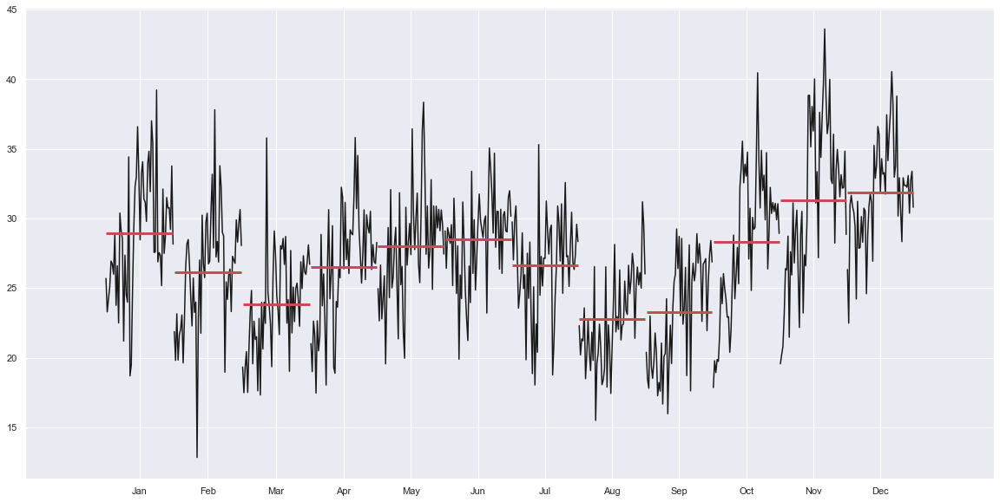

In [ ]:
import seaborn
fig = smapi.graphics.tsa.month_plot(datos_train)

In [ ]:
import statsmodels.api as smapi
modelofinal = smapi.tsa.statespace.SARIMAX(train, trend='n', order=(11,1,11), seasonal_order=(2,1,2,12))  
results_final = modelofinal.fit()###Dentro de los parentesis use_boxcox=False
print(results_final.summary())

                                         SARIMAX Results                                         
Dep. Variable:                                       box   No. Observations:                  639
Model:             SARIMAX(11, 1, 11)x(2, 1, [1, 2], 12)   Log Likelihood               -1591.169
Date:                                   Tue, 29 Nov 2022   AIC                           3236.338
Time:                                           00:35:38   BIC                           3356.201
Sample:                                       01-01-1956   HQIC                          3282.910
                                            - 03-01-2009                                         
Covariance Type:                                     opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0443      5.047     -0.207      0.836    

In [ ]:
## Rolling
from sklearn.metrics import mean_squared_error

X = box_produccionts.values
size = int(len(X) * 0.8)
datos_train, datos_test = X[1:size], X[size:len(X)]
history = [x for x in datos_train]
predicciones = list()
for t in range(len(datos_test)):
	modelo =  smapi.tsa.statespace.SARIMAX(history, trend='n', order=(11,1,11), seasonal_order=(2,1,2,12)) 
	modelo_fit = modelo.fit(disp=0)
	output = modelo_fit.forecast()
	yhat = output[0]
	predicciones.append(yhat)
	obs = datos_test[t]
	history.append(obs)
	print('Predicción=%f, Esperado=%f' % (yhat, obs))
error = mean_squared_error(datos_test, predicciones)
print(error)

Predicción=29.150288, Esperado=19.464102
Predicción=25.975976, Esperado=25.821085
Predicción=26.688145, Esperado=25.574121
Predicción=27.146039, Esperado=23.985779
Predicción=25.599281, Esperado=20.597277
Predicción=24.306502, Esperado=21.980060
Predicción=27.086579, Esperado=23.353931
Predicción=29.982848, Esperado=26.635654
Predicción=30.557147, Esperado=27.450057
Predicción=26.737171, Esperado=22.852246
Predicción=24.808831, Esperado=25.022563
Predicción=23.340409, Esperado=24.731385
Predicción=25.263905, Esperado=25.007377
Predicción=26.774938, Esperado=27.463076
Predicción=27.132059, Esperado=26.907185
Predicción=24.829850, Esperado=27.001156
Predicción=23.695482, Esperado=24.513173
Predicción=24.682293, Esperado=23.113956
Predicción=26.410441, Esperado=27.266700
Predicción=29.753447, Esperado=29.391845
Predicción=29.624148, Esperado=31.422778
Predicción=27.220415, Esperado=28.546458
Predicción=27.140267, Esperado=26.690327
Predicción=24.282293, Esperado=26.893716
Predicción=26.04

In [ ]:
train=sp.special.inv_boxcox(np.array(datos_train[0:]),0.3531163186031495)
test=sp.special.inv_boxcox(np.array(datos_test[0:]),0.3531163186031495)
predicciones=sp.special.inv_boxcox(np.array(predicciones[0:]),0.3531163186031495)

In [ ]:
#Error cuadratico medio escala original
error = mean_squared_error(datos_test, predicciones)
print(error)
import statistics as stats
stats.mean((test - predicciones)**2)

955715.5062280059


29513.593655079498

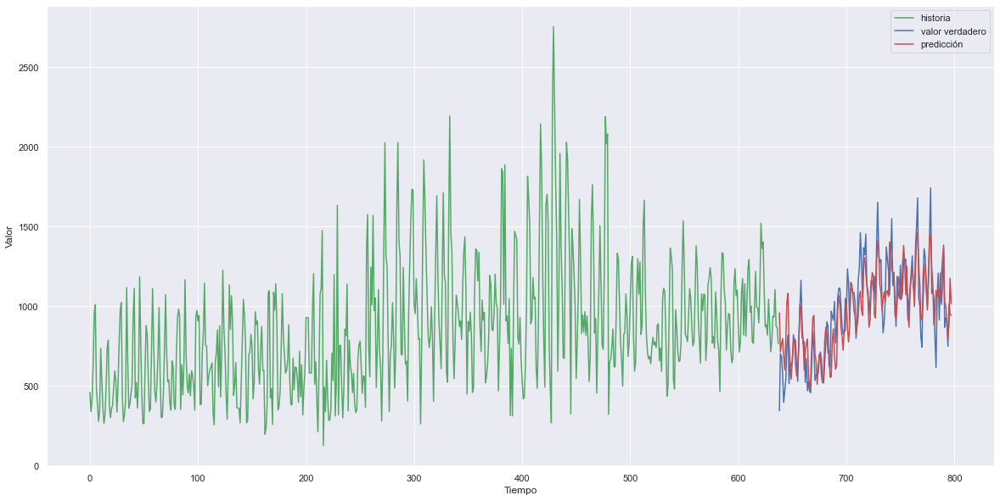

In [ ]:
plt.plot(np.arange(0, len(train)), train, 'g', label="historia")
plt.plot(np.arange(len(train), len(train) + len(test)), test, label="valor verdadero")
plt.plot(np.arange(len(train), len(train) + len(test)), predicciones, 'r', label="predicción")
plt.ylabel('Valor')
plt.xlabel('Tiempo')
plt.legend()
plt.show();

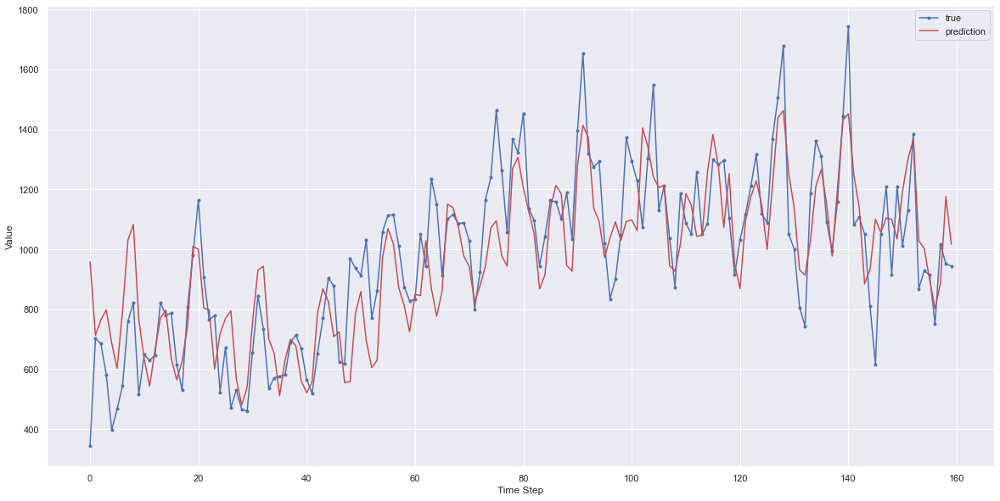

In [ ]:
plt.plot(test, marker='.', label="true")
plt.plot(predicciones, 'r', label="prediction")
plt.ylabel('Value')
plt.xlabel('Time Step')
plt.legend()
plt.show();

array([[1.97862243e+02, 1.08332772e-43, 4.69787393e-01, 5.59135280e+00]])

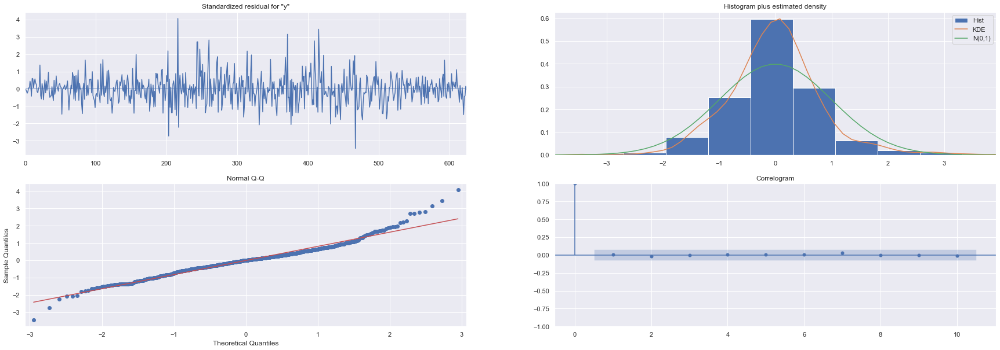

In [ ]:
#####Análisis de Residuales######
residuales=results_final.resid####Residuales no estandarizados

graf_resid=results_final.plot_diagnostics()
#plt.show()
## Hipótesis nula de no heterocedasticidad
results_final.test_heteroskedasticity(method='breakvar') #[Est. de prueba, p-valor]
## Hipótesis nula de normalidad
results_final.test_normality(method='jarquebera')
#1. Estadística de prueba
#2. El p valor
#3. Sesgo estimado de los datos
#4. Curtosis estimada
## Hipótesis nula indica que no se presenta correlación serial

Text(0.5, 1.0, 'Estadística Cusum')

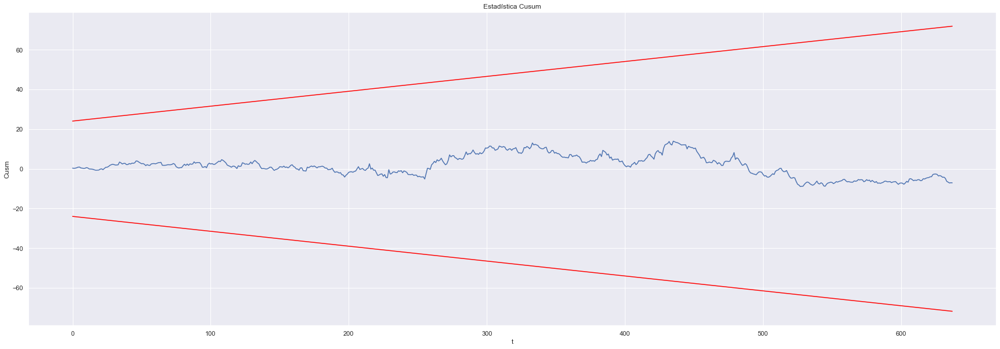

In [ ]:
Res_estand=results_final.standardized_forecasts_error.reshape(638)
cum=Res_estand.cumsum()
N=len(Res_estand)
N
Af_cusum=0.948###Cuantil estadística cusum
LS=Af_cusum*math.sqrt(N)+2*Af_cusum*np.arange(1,N+1)/math.sqrt(N)
LI=-LS
plt.plot(cum)
plt.plot(LS,color='red')
plt.plot(LI,color='red')
plt.xlabel("t")
plt.ylabel("Cusm")
plt.title('Estadística Cusum')

Text(0.5, 1.0, 'Estadística Cusumsq')

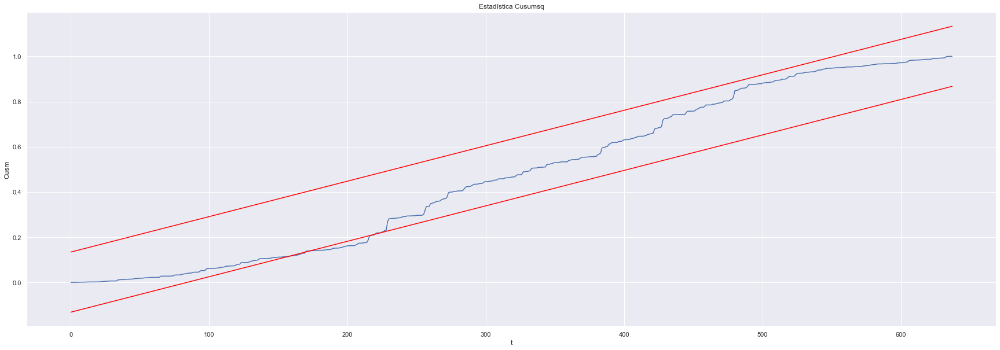

In [ ]:
cumq=(Res_estand**2).cumsum()/sum(Res_estand**2)
co=0.13291####Valor del cuantil aproximado para cusumsq para n/2
LQS=co+np.arange(1,N+1)/N
LQI=-co+np.arange(1,N+1)/N
plt.plot(cumq)
plt.plot(LQS,color='red')
plt.plot(LQI,color='red')
plt.xlabel("t")
plt.ylabel("Cusm")
plt.title('Estadística Cusumsq')

## -Sarima 2

In [ ]:
dataset=box_produccionts
train_size = int(len(dataset) * 0.8)
test_size = len(dataset) - train_size
train, test = dataset.iloc[0:train_size], dataset.iloc[train_size:len(dataset)]
len_train = len(train)
len_test = len(test)
print(len_train, len_test)

639 160


In [ ]:
import statsmodels.api as smapi
modelofina = smapi.tsa.statespace.SARIMAX(train, trend='n', order=(4,1,6), seasonal_order=(1,1,1,12))  
results_fina = modelofina.fit()###Dentro de los parentesis use_boxcox=False
print(results_fina.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                  box   No. Observations:                  639
Model:             SARIMAX(4, 1, 6)x(1, 1, [1], 12)   Log Likelihood               -1602.160
Date:                              Tue, 29 Nov 2022   AIC                           3230.321
Time:                                      00:34:19   BIC                           3288.032
Sample:                                  01-01-1956   HQIC                          3252.744
                                       - 03-01-2009                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.5548      0.195     -7.974      0.000      -1.937      -1.173
ar.L2         -1.56

array([[ 1.02984317e+02,  4.33750214e-23, -8.48879869e-02,
         4.97976176e+00]])

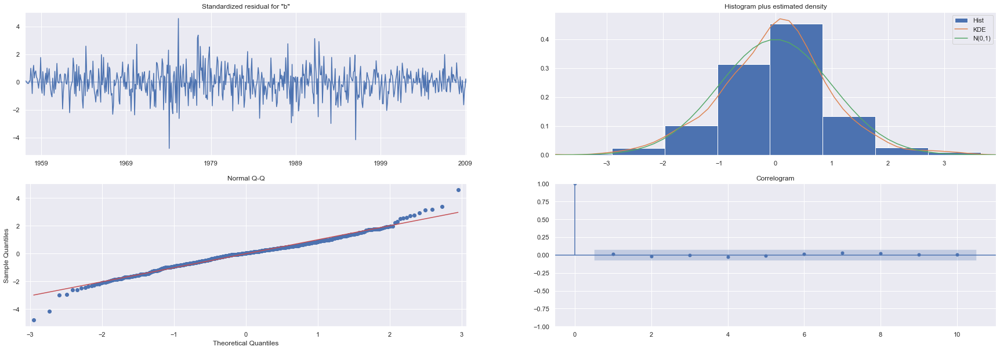

In [ ]:
#####Análisis de Residuales######
residuales=results_final.resid####Residuales no estandarizados

graf_resid=results_final.plot_diagnostics()
#plt.show()
## Hipótesis nula de no heterocedasticidad
results_final.test_heteroskedasticity(method='breakvar') #[Est. de prueba, p-valor]
## Hipótesis nula de normalidad
results_final.test_normality(method='jarquebera')
#1. Estadística de prueba
#2. El p valor
#3. Sesgo estimado de los datos
#4. Curtosis estimada
## Hipótesis nula indica que no se presenta correlación serial

Text(0.5, 1.0, 'Estadística Cusum')

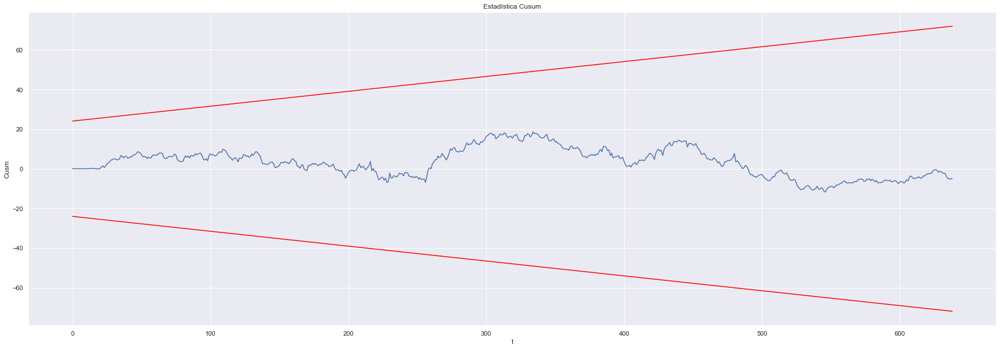

In [ ]:
Res_estand=results_final.standardized_forecasts_error.reshape(639)
cum=Res_estand.cumsum()
N=len(Res_estand)
N
Af_cusum=0.948###Cuantil estadística cusum
LS=Af_cusum*math.sqrt(N)+2*Af_cusum*np.arange(1,N+1)/math.sqrt(N)
LI=-LS
plt.plot(cum)
plt.plot(LS,color='red')
plt.plot(LI,color='red')
plt.xlabel("t")
plt.ylabel("Cusm")
plt.title('Estadística Cusum')

Text(0.5, 1.0, 'Estadística Cusumsq')

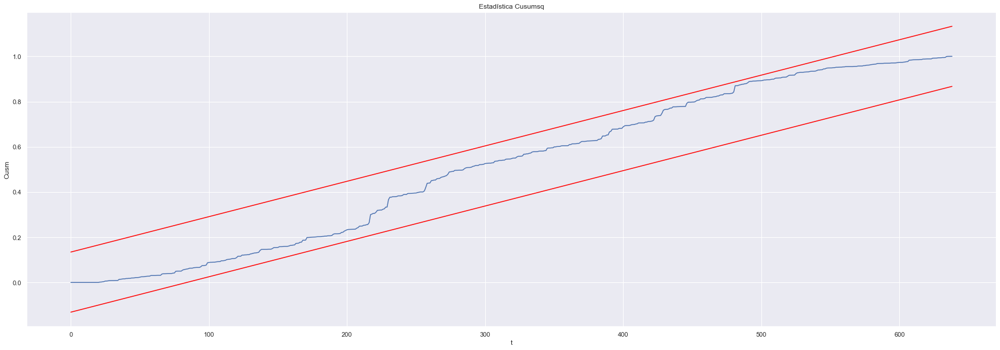

In [ ]:
cumq=(Res_estand**2).cumsum()/sum(Res_estand**2)
co=0.13291####Valor del cuantil aproximado para cusumsq para n/2
LQS=co+np.arange(1,N+1)/N
LQI=-co+np.arange(1,N+1)/N
plt.plot(cumq)
plt.plot(LQS,color='red')
plt.plot(LQI,color='red')
plt.xlabel("t")
plt.ylabel("Cusm")
plt.title('Estadística Cusumsq')

In [ ]:

from sklearn.metrics import mean_squared_error

X = box_produccionts.values
size = int(len(X) * 0.8)
train, test = X[1:size], X[size:len(X)]
history = [x for x in train]
predicciones = list()
for t in range(len(test)):
	modelo = smapi.tsa.statespace.SARIMAX(history, trend='n', order=(4,1,6), seasonal_order=(1,1,1,12))
	modelo_fit = modelo.fit(disp=0)
	output = modelo_fit.forecast()
	yhat = output[0]
	predicciones.append(yhat)
	obs = test[t]
	history.append(obs)
	#print('Predicción=%f, Esperado=%f' % (yhat, obs))
error_SARIMA = mean_squared_error(test, predicciones)
print(error_SARIMA)

4.434809094935065


In [ ]:
train1=sp.special.inv_boxcox(np.array(train[0:]),0.3531163186031495)
test1=sp.special.inv_boxcox(np.array(test[0:]),0.3531163186031495)
predicciones1=sp.special.inv_boxcox(np.array(predicciones[0:]),0.3531163186031495)

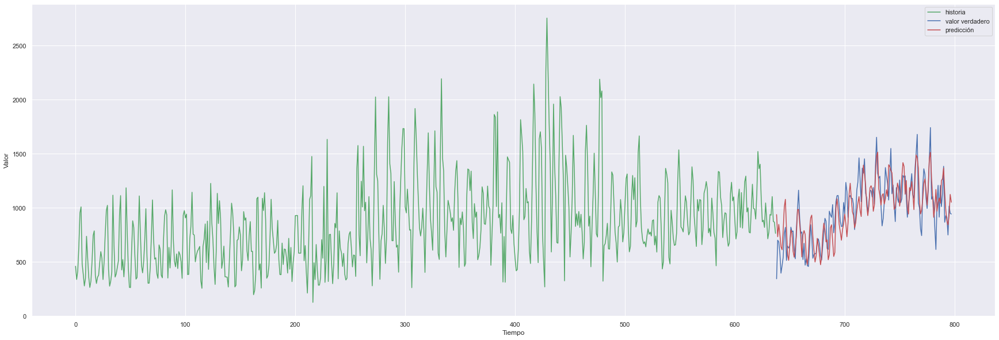

In [ ]:
plt.plot(np.arange(0, len(train1)), train1, 'g', label="historia")
plt.plot(np.arange(len(train1), len(train1) + len(test1)), test1, label="valor verdadero")
plt.plot(np.arange(len(train1), len(train1) + len(test1)), predicciones1, 'r', label="predicción")
plt.ylabel('Valor')
plt.xlabel('Tiempo')
plt.legend()
plt.show();

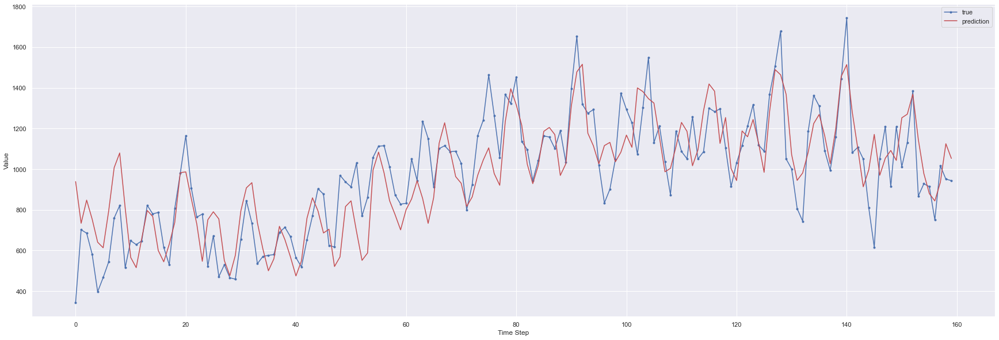

In [ ]:
plt.plot(test1, marker='.', label="true")
plt.plot(predicciones1, 'r', label="prediction")
plt.ylabel('Value')
plt.xlabel('Time Step')
plt.legend()
plt.show();

In [ ]:
from sklearn.metrics import mean_squared_error
error_SARIMA = sklearn.metrics.mean_squared_error(test1,predicciones1)
print(error_SARIMA)

28095.520892160344


## - Arboles de decisión -

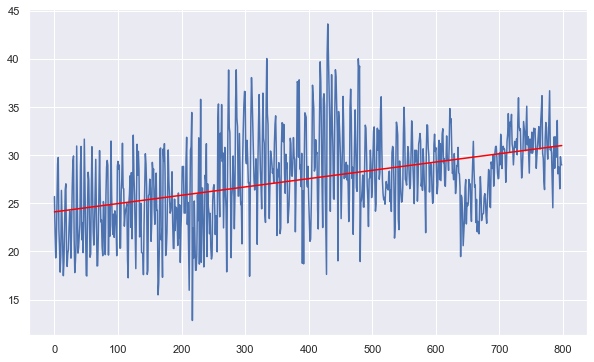

El coeficiente para el modelo planteado es de [0.1034672].
El intercepto del modelo planteado es -178.2864067293142.


In [ ]:
from sklearn.linear_model import LinearRegression
X1=np.arange(1956+1/12,2022+7.5/12,1/12) # Donde comienza la serie, donde termina y la frecuencia que tiene
X=X1
X = np.reshape(X, (len(X), 1))
y = box_produccionts.values
model = LinearRegression()
model.fit(X, y)
trend = model.predict(X)
plt.figure(figsize=(10,6)) ### Se define el tamaño del gráfico
plt.plot(y)
plt.plot(trend, color='red')
plt.show()
print('El coeficiente para el modelo planteado es de {}.'.format(model.coef_))
print('El intercepto del modelo planteado es {}.'.format(model.intercept_))

Fecha
1956-01-01    1.586765
1956-02-01   -2.245663
1956-03-01   -4.794905
1956-04-01   -3.122474
1956-05-01    0.823175
                ...   
2022-03-01   -2.330623
2022-04-01   -4.460611
2022-05-01   -1.139304
2022-06-01   -1.912661
2022-07-01   -2.009153
Length: 799, dtype: float64
<class 'pandas.core.series.Series'>


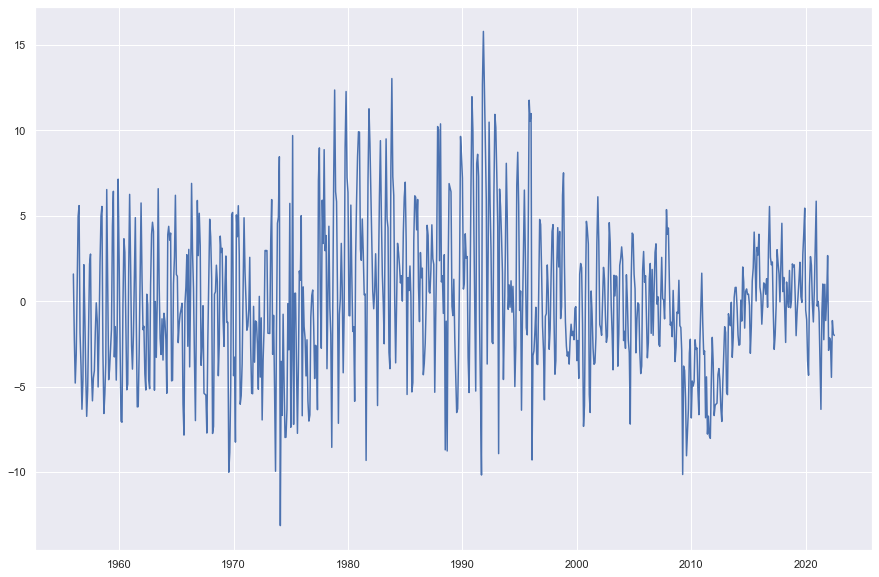

In [ ]:
# Gráfico de la serie con la tendencia eliminada
# Gráfica detrend
detrended = [y[i]-trend[i] for i in range(0, len(box_produccionts))]
Produccion_detrend = pd.Series(detrended, index = box_produccionts.index)
print(Produccion_detrend)
print(type(Produccion_detrend))
# plot detrended
plt.plot(Produccion_detrend)
plt.show()

In [ ]:
import scipy as sp
import sklearn


### Creación de variables rezagadas

In [ ]:
from pandas import DataFrame #Nuevo dataframe
df1 = DataFrame()
print(df1)

Empty DataFrame
Columns: []
Index: []


In [ ]:
Produccion_detrend=Produccion_detrend
Produccion_detrend.head(5)

Fecha
1956-01-01    1.586765
1956-02-01   -2.245663
1956-03-01   -4.794905
1956-04-01   -3.122474
1956-05-01    0.823175
dtype: float64

In [ ]:
Produccion_detrend=pd.DataFrame(Produccion_detrend)
Produccion_detrend.head(5)

,0
Fecha,
1956-01-01,1.586765
1956-02-01,-2.245663
1956-03-01,-4.794905
1956-04-01,-3.122474
1956-05-01,0.823175


In [ ]:
Producciondf =Produccion_detrend

In [ ]:
for i in range(12,0,-1):
    df1[['t-'+str(i)]] = Producciondf.shift(i)

In [ ]:
print(df1)

                t-12      t-11      t-10       t-9       t-8       t-7  \
Fecha                                                                    
1956-01-01       NaN       NaN       NaN       NaN       NaN       NaN   
1956-02-01       NaN       NaN       NaN       NaN       NaN       NaN   
1956-03-01       NaN       NaN       NaN       NaN       NaN       NaN   
1956-04-01       NaN       NaN       NaN       NaN       NaN       NaN   
1956-05-01       NaN       NaN       NaN       NaN       NaN       NaN   
...              ...       ...       ...       ...       ...       ...   
2022-03-01 -0.648231 -3.549134 -6.335054 -0.651895  1.003513 -2.258120   
2022-04-01 -3.549134 -6.335054 -0.651895  1.003513 -2.258120  0.986268   
2022-05-01 -6.335054 -0.651895  1.003513 -2.258120  0.986268 -1.135739   
2022-06-01 -0.651895  1.003513 -2.258120  0.986268 -1.135739  0.161006   
2022-07-01  1.003513 -2.258120  0.986268 -1.135739  0.161006  2.667105   

                 t-6       t-5       

In [ ]:
df1['t'] = Producciondf.values

In [ ]:
df1_Produccion = df1[12:]
print(df1_Produccion)
print(Producciondf)
Producciondf.size

                t-12      t-11      t-10       t-9       t-8       t-7  \
Fecha                                                                    
1957-01-01  1.586765 -2.245663 -4.794905 -3.122474  0.823175  4.951667   
1957-02-01 -2.245663 -4.794905 -3.122474  0.823175  4.951667  5.592729   
1957-03-01 -4.794905 -3.122474  0.823175  4.951667  5.592729 -1.869098   
1957-04-01 -3.122474  0.823175  4.951667  5.592729 -1.869098 -3.785879   
1957-05-01  0.823175  4.951667  5.592729 -1.869098 -3.785879 -6.328141   
...              ...       ...       ...       ...       ...       ...   
2022-03-01 -0.648231 -3.549134 -6.335054 -0.651895  1.003513 -2.258120   
2022-04-01 -3.549134 -6.335054 -0.651895  1.003513 -2.258120  0.986268   
2022-05-01 -6.335054 -0.651895  1.003513 -2.258120  0.986268 -1.135739   
2022-06-01 -0.651895  1.003513 -2.258120  0.986268 -1.135739  0.161006   
2022-07-01  1.003513 -2.258120  0.986268 -1.135739  0.161006  2.667105   

                 t-6       t-5       

799

### dividir los datos

In [ ]:
# Split data
Produccionsplit = df1_Produccion.values
# split into lagged variables and original time series
X1= Produccionsplit[:, 0:-1]  # slice all rows and start with column 0 and go up to but not including the last column
y1 =Produccionsplit[:,-1]  # slice all rows and last column, essentially separating out 't' column

In [ ]:
print(X1[0])
print(y1[0])

[ 1.58676526 -2.24566298 -4.794905   -3.12247375  0.82317517  4.95166683
  5.59272927 -1.869098   -3.78587874 -6.32814068 -4.63524007  2.13267002]
-0.9217505779455735


In [ ]:
#agegar
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [ ]:
#agegar
#Entrenamiento, validacion y prueba
X_trainF, X_test, y_trainF, y_test = train_test_split(X1,y1,test_size=0.2, train_size=0.8, shuffle=False)

X_train, X_val, y_train, y_val = train_test_split(X_trainF,y_trainF, test_size = 0.225, train_size = 0.775, shuffle=False)

In [ ]:
# Decision Tree Regresion Model


from sklearn.tree import DecisionTreeRegressor

# Create a decision tree regression model with default arguments
decision_tree_Produccion = DecisionTreeRegressor()  # max-depth not set
# The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.
# Fit the model to the training features(covariables) and targets(respuestas)
decision_tree_Produccion.fit(X_train, y_train)

# Check the score on train and test
print("Coeficiente R2 sobre el conjunto de entrenamiento:",decision_tree_Produccion.score(X_train, y_train))
print("Coeficiente R2 sobre el conjunto de Validación:",decision_tree_Produccion.score(X_val,y_val))  # predictions are horrible if negative value, no relationship if 0

print("el RECM es:",(((decision_tree_Produccion.predict(X_val)-y_val)**2).sum())**0.5)

Coeficiente R2 sobre el conjunto de entrenamiento: 1.0
Coeficiente R2 sobre el conjunto de Validación: -0.4560655296373195
el RECM es: 42.836947933000445


In [ ]:
for d in [2, 3, 4, 5,6,7,8,9,10]:
    # Create the tree and fit it
    decision_tree_Produccion = DecisionTreeRegressor(max_depth=d)
    decision_tree_Produccion.fit(X_train, y_train)

    # Print out the scores on train and test
    print('max_depth=', str(d))
    print("Coeficiente R2 sobre el conjunto de entrenamiento:",decision_tree_Produccion.score(X_train, y_train))
    print("Coeficiente R2 sobre el conjunto de Validación:",decision_tree_Produccion.score(X_val, y_val), '\n')  # You want the test score to be positive and high
    print("el RECM sobre el conjunto de prueba es:",sklearn.metrics.mean_squared_error(decision_tree_Produccion.predict(X_val),y_val, squared=False))

max_depth= 2
Coeficiente R2 sobre el conjunto de entrenamiento: 0.37424376299982043
Coeficiente R2 sobre el conjunto de Validación: 0.2673469014576769 

el RECM sobre el conjunto de prueba es: 2.5499583286119285
max_depth= 3
Coeficiente R2 sobre el conjunto de entrenamiento: 0.4711960745932038
Coeficiente R2 sobre el conjunto de Validación: 0.1996969445113549 

el RECM sobre el conjunto de prueba es: 2.665085371164842
max_depth= 4
Coeficiente R2 sobre el conjunto de entrenamiento: 0.5550530901774986
Coeficiente R2 sobre el conjunto de Validación: 0.277881302066481 

el RECM sobre el conjunto de prueba es: 2.531559756035877
max_depth= 5
Coeficiente R2 sobre el conjunto de entrenamiento: 0.6252817736059275
Coeficiente R2 sobre el conjunto de Validación: 0.22229873012415924 

el RECM sobre el conjunto de prueba es: 2.6271827989102245
max_depth= 6
Coeficiente R2 sobre el conjunto de entrenamiento: 0.7073890539717141
Coeficiente R2 sobre el conjunto de Validación: 0.18734818544324938 

el R

max_depth=4 vemos una mejoría en el valor de ambos coeficientes sin embargo cuando llegamos a max_depth=5 el coeficiente para los datos de prueba vuelven a disminuir, al igual que el RECM va en aumento hasta el max_depth=4, por tanto lo más optimos sería quedarse con max_depth=4, 



### Usando la Penalización

In [ ]:
path=decision_tree_Produccion.cost_complexity_pruning_path(X_train, y_train)
alphas=path['ccp_alphas']
print(alphas)
print(alphas.min())
print(alphas.max())
div=25

[0.00000000e+00 3.32931510e-06 8.12332452e-06 8.16307272e-06
 8.65057493e-06 1.17254094e-05 1.34032633e-05 1.46606328e-05
 2.75359443e-05 3.75793971e-05 4.90152990e-05 5.24090074e-05
 7.55461541e-05 9.06767127e-05 9.94742442e-05 1.04400258e-04
 1.10957208e-04 1.16451655e-04 1.25524759e-04 1.26630980e-04
 1.34089732e-04 1.36603733e-04 1.41279234e-04 1.46431730e-04
 1.59856101e-04 1.67594118e-04 1.80444546e-04 1.80650115e-04
 1.85224013e-04 1.88130165e-04 1.90611498e-04 1.99582049e-04
 2.06881089e-04 2.11989176e-04 2.21826958e-04 3.19762498e-04
 3.19927119e-04 3.31480155e-04 3.32698024e-04 3.64609277e-04
 3.84910989e-04 4.01419852e-04 4.22916478e-04 5.04246884e-04
 5.13943371e-04 5.19079033e-04 5.87333638e-04 6.02959998e-04
 6.44006131e-04 6.48517869e-04 6.91104044e-04 7.30385135e-04
 7.42344068e-04 7.68579775e-04 7.72227086e-04 7.82956250e-04
 8.04720083e-04 8.58532485e-04 9.41885423e-04 1.01022640e-03
 1.01604543e-03 1.08549650e-03 1.21186050e-03 1.22121282e-03
 1.28606280e-03 1.323553

In [ ]:
accuracy_train,accuracy_test=[],[]
for i in alphas:
    tree=DecisionTreeRegressor(ccp_alpha=i)

    tree.fit(X_train, y_train)
    y_train_pred=tree.predict(X_train)
    y_test_pred=tree.predict(X_val)


    accuracy_train.append(sklearn.metrics.mean_squared_error(y_train_pred, y_train, squared=False))
    accuracy_test.append(sklearn.metrics.mean_squared_error(y_test_pred, y_val,squared=False))

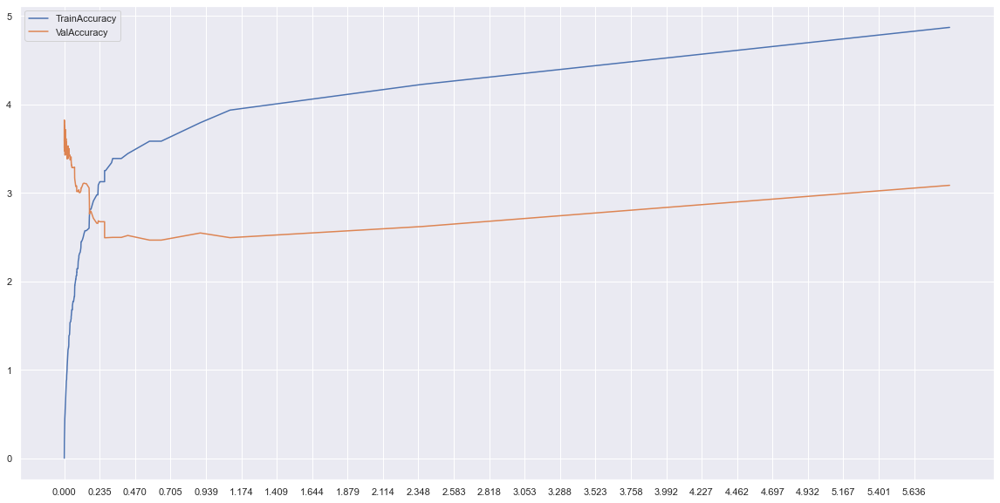

In [ ]:
import seaborn as sns
sns.set()
rcParams['figure.figsize'] = 30,10
plt.figure(figsize=(20,10))

sns.lineplot(y=accuracy_train,x=alphas,label="TrainAccuracy")

sns.lineplot(y=accuracy_test,x=alphas,label="ValAccuracy")

plt.xticks(ticks=np.arange(0.00,alphas.max(),(alphas.max()-alphas.min())/div
))
plt.show()

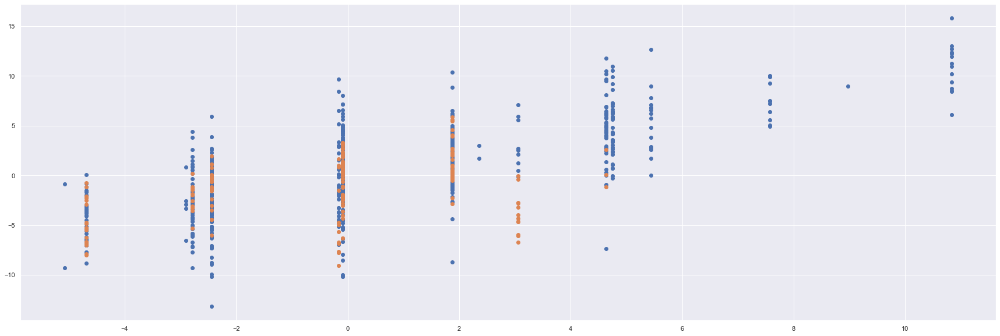

In [ ]:
####entrenamiento y Prueba y_trainF.size
# Plot predicted against actual values

from matplotlib import pyplot as plt

# Use the best max_depth 
decision_tree_Produccion = DecisionTreeRegressor(max_depth=4)  # fill in best max depth here
decision_tree_Produccion.fit(X_trainF, y_trainF)

# Predict values for train and test
train_prediction = decision_tree_Produccion.predict(X_trainF)
test_prediction = decision_tree_Produccion.predict(X_test)

# Scatter the predictions vs actual values
plt.scatter(train_prediction, y_trainF, label='train')  # blue
plt.scatter(test_prediction, y_test, label='test')  # orange
plt.show()
#print("Raíz de la Pérdida cuadrática Entrenamiento:",sklearn.metrics.mean_squared_error( y_train_pred, y_trainF,squared=False))

#print("Raíz de la Pérdida cuadrática Prueba:",sklearn.metrics.mean_squared_error(y_test_pred, y_test,squared=False))

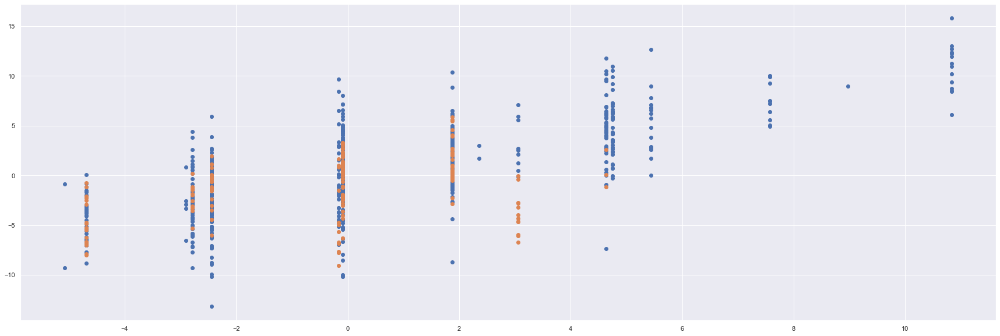

In [ ]:
# Plot predicted against actual values

from matplotlib import pyplot as plt

# Use the best max_depth 
decision_tree_Produccion_prun_mincost = DecisionTreeRegressor(ccp_alpha=0.381)  # fill in best max depth here
decision_tree_Produccion_prun_mincost.fit(X_trainF, y_trainF)

# Predict values for train and test
train_prediction_prun_mincost = decision_tree_Produccion.predict(X_trainF)
test_prediction_prun_mincost = decision_tree_Produccion.predict(X_test)

# Scatter the predictions vs actual values
plt.scatter(train_prediction_prun_mincost, y_trainF, label='train')  # blue
plt.scatter(test_prediction_prun_mincost, y_test, label='test')  # orange
plt.show()

In [ ]:
from sklearn import tree

listacaract=list(df1_Produccion.columns.values)
respuesta=listacaract.pop()
text_representation = tree.export_text(decision_tree_Produccion)
print(text_representation)

|--- feature_0 <= -0.89
|   |--- feature_2 <= -6.44
|   |   |--- feature_3 <= -0.86
|   |   |   |--- feature_3 <= -1.68
|   |   |   |   |--- value: [3.06]
|   |   |   |--- feature_3 >  -1.68
|   |   |   |   |--- value: [8.97]
|   |   |--- feature_3 >  -0.86
|   |   |   |--- feature_3 <= 3.39
|   |   |   |   |--- value: [-2.90]
|   |   |   |--- feature_3 >  3.39
|   |   |   |   |--- value: [2.36]
|   |--- feature_2 >  -6.44
|   |   |--- feature_0 <= -3.70
|   |   |   |--- feature_11 <= -2.66
|   |   |   |   |--- value: [-4.69]
|   |   |   |--- feature_11 >  -2.66
|   |   |   |   |--- value: [-2.79]
|   |   |--- feature_0 >  -3.70
|   |   |   |--- feature_8 <= -2.54
|   |   |   |   |--- value: [-0.16]
|   |   |   |--- feature_8 >  -2.54
|   |   |   |   |--- value: [-2.44]
|--- feature_0 >  -0.89
|   |--- feature_11 <= 5.85
|   |   |--- feature_11 <= 0.84
|   |   |   |--- feature_1 <= 7.79
|   |   |   |   |--- value: [-0.09]
|   |   |   |--- feature_1 >  7.79
|   |   |   |   |--- value: [

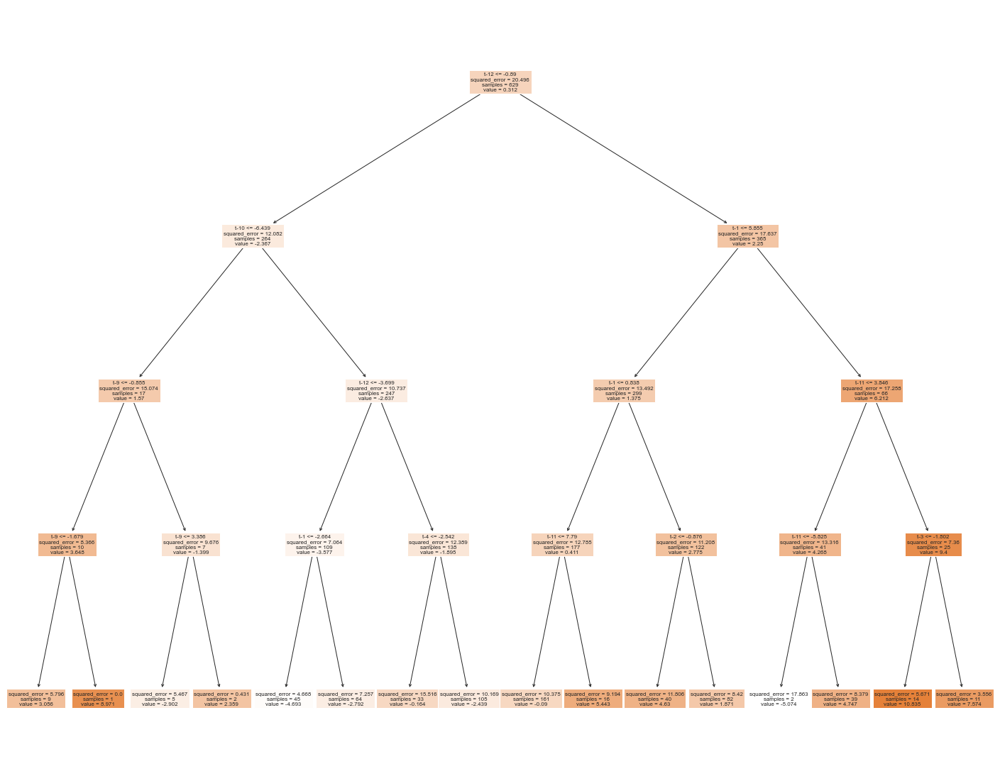

In [ ]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(decision_tree_Produccion, 
                   feature_names=listacaract,  
                   class_names=respuesta,
                   filled=True)

In [ ]:
print(train_prediction.size)
print(X_trainF.size)

print(test_prediction.size)
print(y_test.size)

629
7548
158
158


In [ ]:
indicetrian_test=df1_Produccion.index
print(indicetrian_test.size)  ###Tamaño del índice
indicetrain=indicetrian_test[0:629]
indicetest=indicetrian_test[629:787]

787


In [ ]:
targetjoint=np.concatenate((y_trainF,y_test))
predictionjoint=np.concatenate((train_prediction,test_prediction))
print(targetjoint.size)
print(predictionjoint.size)

787
787


In [ ]:
d = {'observado': targetjoint, 'Predicción': predictionjoint}
ObsvsPred=pd.DataFrame(data=d,index=indicetrian_test)
ObsvsPred.head(10)

,observado,Predicción
Fecha,,
1957-01-01,-0.921751,4.629508
1957-02-01,-4.414443,-0.164204
1957-03-01,-6.743898,-4.693066
1957-04-01,-5.234546,-2.439322
1957-05-01,-1.602714,-0.089512
1957-06-01,2.164442,-0.089512
1957-07-01,2.755273,4.629508
1957-08-01,-4.072852,-0.164204
1957-09-01,-5.836200,-4.693066


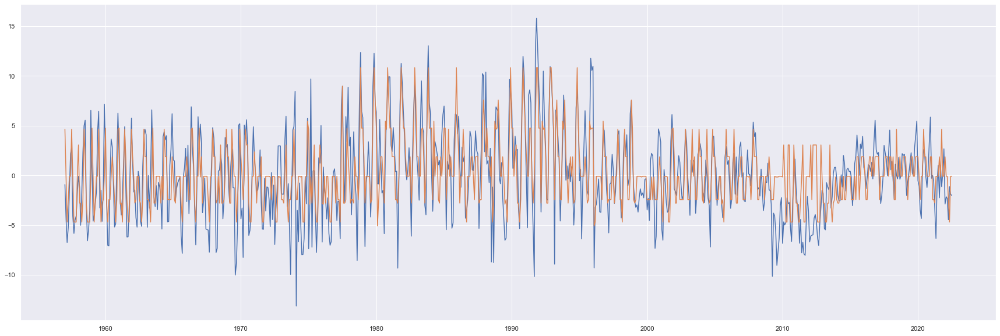

In [ ]:
plt.plot(ObsvsPred)

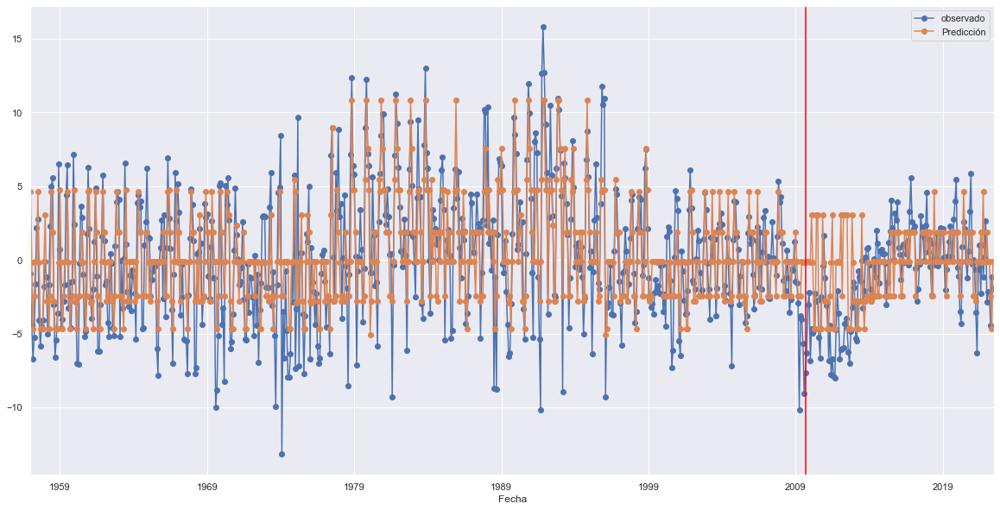

In [ ]:
ax = ObsvsPred.plot( marker="o", figsize=(20,10))
ax.axvline(x=indicetrian_test[632].date(),color='red')

In [ ]:
## Error cuadratico medio de predicción árbol de decisión
import statistics as stats
stats.mean((ObsvsPred["observado"] - ObsvsPred["Predicción"])**2)

9.512260059316093

In [ ]:
# Gráfico de la serie con la tendencia eliminada
# Gráfica detrend
inv_ObsvsPred = [targetjoint[i]+trend[i] for i in range(0, len(ObsvsPred))]
inv_ObsvsPred_detrend = pd.Series(inv_ObsvsPred, index = ObsvsPred.index)

In [ ]:
# Gráfico de la serie con la tendencia eliminada
# Gráfica detrend
inv_ObsvsPred1 = [predictionjoint[i]+trend[i] for i in range(0, len(ObsvsPred))]
inv_ObsvsPred_detrend1 = pd.Series(inv_ObsvsPred1, index = ObsvsPred.index)

In [ ]:
inv_ObsvsPred_detrend11=sp.special.inv_boxcox(np.array(inv_ObsvsPred_detrend1[0:]),0.3531163186031495)
inv_ObsvsPred_detrend1=sp.special.inv_boxcox(np.array(inv_ObsvsPred_detrend[0:]),0.3531163186031495)

In [ ]:
d1 = {'observado': inv_ObsvsPred_detrend1, 'Predicción': inv_ObsvsPred_detrend11}
ObsvsPred11=pd.DataFrame(data=d1,index=indicetrian_test)

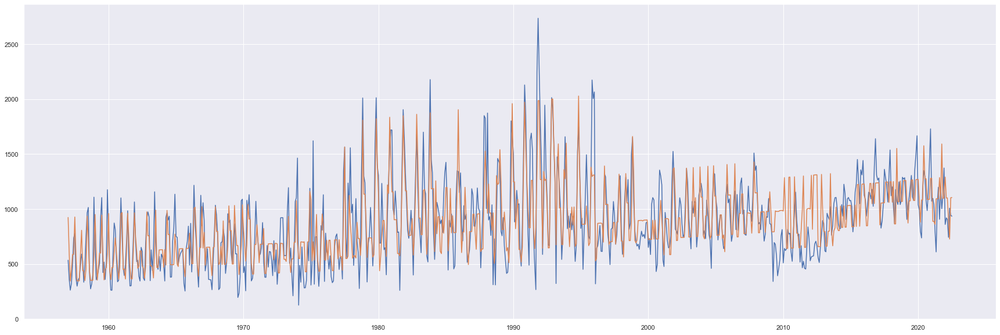

In [ ]:
plt.plot(ObsvsPred11)

In [ ]:
print("Árbol de decisión",stats.mean((ObsvsPred11["observado"][632:798] - ObsvsPred11["Predicción"][632:798])**2),"\n")

Árbol de decisión 71670.90877329191 




## - Redes neuronales -

### Red Nueronal con una sola Capa oculta(MLP)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

##### - DIVISION

In [ ]:
from pandas import DataFrame #Nuevo dataframe
df1 = DataFrame()
print(df1)

Empty DataFrame
Columns: []
Index: []


In [ ]:
box_produccionts=pd.DataFrame(box_produccionts)
box_produccionts.head(5)

,box
Fecha,
1956-01-01,25.690827
1956-02-01,21.867021
1956-03-01,19.326401
1956-04-01,21.007455
1956-05-01,24.961726


In [ ]:
Producciondf =box_produccionts

In [ ]:
for i in range(12,0,-1):
    df1[['t-'+str(i)]] = Producciondf.shift(i)

In [ ]:
df1['t'] = Producciondf.values

In [ ]:
df1_Produccion = df1[12:]
print(df1_Produccion)
print(Producciondf)
Producciondf.size

                 t-12       t-11       t-10        t-9        t-8        t-7  \
Fecha                                                                          
1957-01-01  25.690827  21.867021  19.326401  21.007455  24.961726  29.098840   
1957-02-01  21.867021  19.326401  21.007455  24.961726  29.098840  29.748525   
1957-03-01  19.326401  21.007455  24.961726  29.098840  29.748525  22.295320   
1957-04-01  21.007455  24.961726  29.098840  29.748525  22.295320  20.387161   
1957-05-01  24.961726  29.098840  29.748525  22.295320  20.387161  17.853522   
...               ...        ...        ...        ...        ...        ...   
2022-03-01  30.198443  27.306163  24.528865  30.220646  31.884676  28.631666   
2022-04-01  27.306163  24.528865  30.220646  31.884676  28.631666  31.884676   
2022-05-01  24.528865  30.220646  31.884676  28.631666  31.884676  29.771292   
2022-06-01  30.220646  31.884676  28.631666  31.884676  29.771292  31.076658   
2022-07-01  31.884676  28.631666  31.884

799

In [ ]:
# Split data
Produccionsplit = df1_Produccion.values
# split into lagged variables and original time series
X1= Produccionsplit[:, 0:-1]  # slice all rows and start with column 0 and go up to but not including the last column
y1 =Produccionsplit[:,-1]  # slice all rows and last column, essentially separating out 't' column

#### - Entrenamiento

In [ ]:
#Entrenamiento, validacion y prueba
X_trainF, X_test, y_trainF, y_test = train_test_split(X1,y1,test_size=0.2, train_size=0.8, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_trainF,y_trainF, test_size = 0.225, train_size = 0.775, shuffle=False)

In [ ]:
import tensorflow as tf
import tensorflow.keras as keras

model = keras.models.Sequential([keras.layers.Dense(64, activation = "relu", input_shape = X_train.shape[1:]), keras.layers.Dense(1)])
#primera capa oculta con 64 unidades 
#capa de salida con una de salida
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_45 (Dense)            (None, 64)                832       
                                                                 
 dense_46 (Dense)            (None, 1)                 65        
                                                                 
Total params: 897
Trainable params: 897
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(loss = "mean_squared_error", optimizer = "adam")
history = model.fit(X_train, y_train, epochs = 150, validation_data = (X_val,y_val))

Epoch 1/150
16/16 [==============================] - 1s 13ms/step - loss: 86.5577 - val_loss: 34.8022
Epoch 2/150
16/16 [==============================] - 0s 4ms/step - loss: 32.6062 - val_loss: 15.0642
Epoch 3/150
16/16 [==============================] - 0s 4ms/step - loss: 26.2861 - val_loss: 9.7300
Epoch 4/150
16/16 [==============================] - 0s 4ms/step - loss: 23.8271 - val_loss: 8.1211
Epoch 5/150
16/16 [==============================] - 0s 4ms/step - loss: 22.0999 - val_loss: 7.8081
Epoch 6/150
16/16 [==============================] - 0s 4ms/step - loss: 20.9653 - val_loss: 7.3650
Epoch 7/150
16/16 [==============================] - 0s 5ms/step - loss: 20.0293 - val_loss: 7.0086
Epoch 8/150
16/16 [==============================] - 0s 5ms/step - loss: 19.0251 - val_loss: 6.7399
Epoch 9/150
16/16 [==============================] - 0s 4ms/step - loss: 18.1236 - val_loss: 7.4921
Epoch 10/150
16/16 [==============================] - 0s 4ms/step - loss: 17.4474 - val_loss: 6.3

<AxesSubplot: >

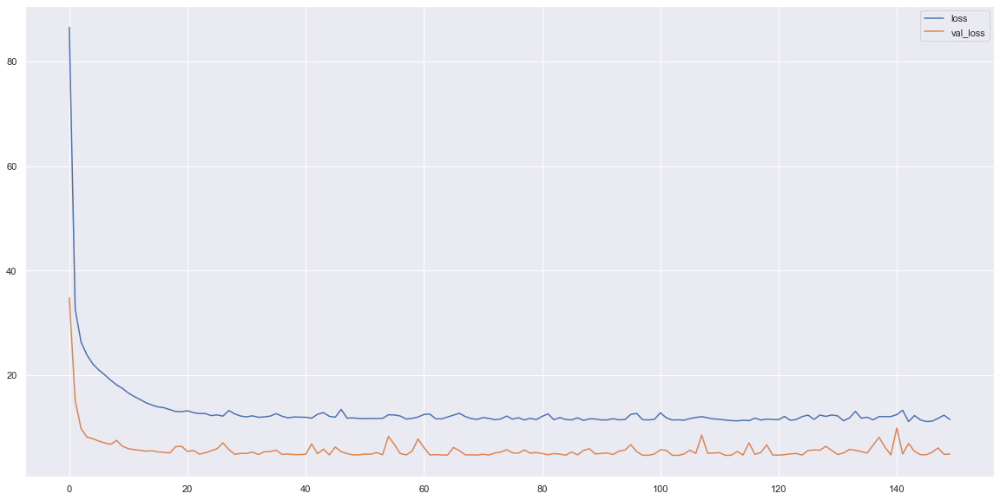

In [ ]:
pd.DataFrame(history.history).plot(figsize=(20,10))

In [ ]:
mse_test = model.evaluate(X_test,y_test)
print(mse_test)

5/5 [==============================] - 0s 2ms/step - loss: 4.1124
4.1124491691589355


In [ ]:
ypred = model.predict(X_test)
print(ypred)

5/5 [==============================] - 0s 1ms/step
[[27.34655 ]
 [26.71188 ]
 [24.81808 ]
 [24.906641]
 [24.707811]
 [27.0262  ]
 [28.884869]
 [26.371302]
 [23.721876]
 [23.227121]
 [23.002386]
 [25.182974]
 [25.39082 ]
 [23.771786]
 [23.143341]
 [23.269205]
 [23.758642]
 [26.57663 ]
 [27.32934 ]
 [27.058466]
 [25.01823 ]
 [24.303911]
 [25.747925]
 [26.088362]
 [26.22214 ]
 [23.741455]
 [22.26123 ]
 [23.746576]
 [25.532375]
 [27.491684]
 [28.689198]
 [25.777693]
 [24.307362]
 [23.49939 ]
 [23.919182]
 [24.34907 ]
 [23.59607 ]
 [23.588282]
 [22.965084]
 [23.19286 ]
 [24.272251]
 [25.535366]
 [25.612595]
 [25.476784]
 [24.681541]
 [23.25875 ]
 [24.104746]
 [26.929455]
 [27.488451]
 [25.873158]
 [24.621181]
 [24.296322]
 [26.812378]
 [28.141888]
 [29.000772]
 [27.91981 ]
 [26.111906]
 [26.326752]
 [28.47532 ]
 [28.211426]
 [29.27459 ]
 [28.277103]
 [28.563433]
 [28.792433]
 [28.91785 ]
 [29.904255]
 [29.879025]
 [29.27111 ]
 [28.741333]
 [27.802925]
 [27.831194]
 [29.528877]
 [30.380175]


In [ ]:
print(range(y_test.size))

range(0, 158)


In [ ]:
y_test1=y_test

Text(0.5, 0, 'Index')

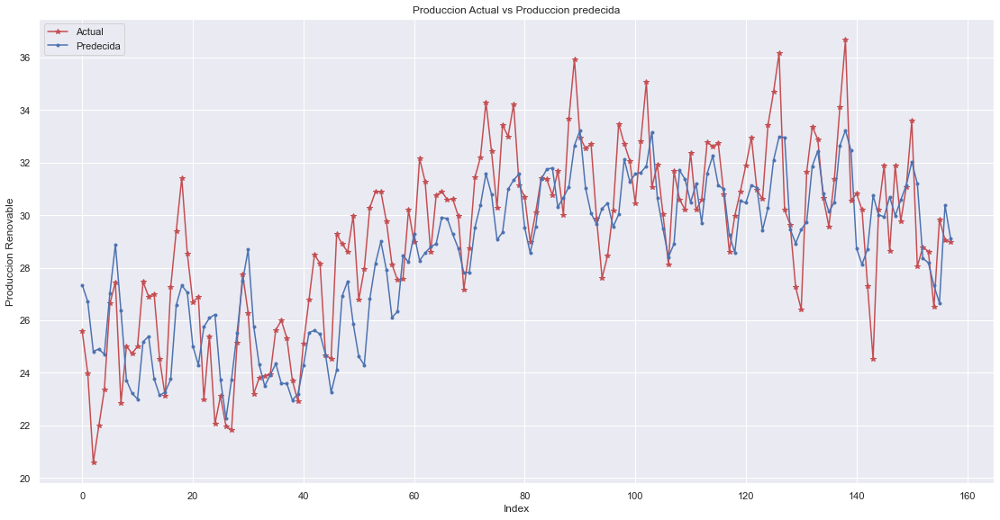

In [ ]:
plt.figure(figsize=(19, 9.5))
plt.plot(range(y_test.size), y_test, linestyle='-', marker='*', color='r')
plt.plot(range(ypred.size), ypred, linestyle='-', marker='.', color='b') 
plt.legend(['Actual','Predecida'], loc=2)
plt.title('Produccion Actual vs Produccion predecida')
plt.ylabel('Produccion Renovable')
plt.xlabel('Index')

In [ ]:
# Error cuadratico medio de predicción de red neuronal #
import statistics as stats
print(mse_test)

4.1124491691589355


#### Devolverse

In [ ]:
ypred1=sp.special.inv_boxcox(np.array(ypred[0:]),0.3531163186031495)
y_test1=sp.special.inv_boxcox(np.array(y_test[0:]),0.3531163186031495)
y_train1=sp.special.inv_boxcox(np.array(y_train[0:]),0.3531163186031495)

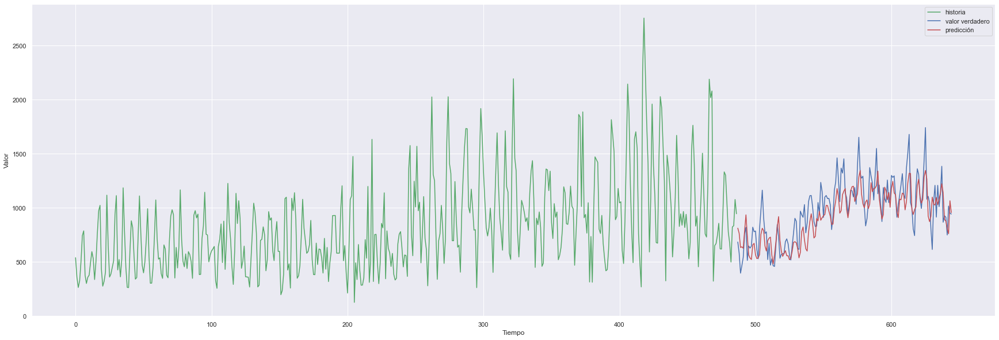

In [ ]:
plt.plot(np.arange(0, len(y_train1)), y_train1, 'g', label="historia")
plt.plot(np.arange(len(y_train1), len(y_train1) + len(y_test1)), y_test1, label="valor verdadero")
plt.plot(np.arange(len(y_train1), len(y_train1) + len(y_test1)), ypred1, 'r', label="predicción")
plt.ylabel('Valor')
plt.xlabel('Tiempo')
plt.legend()
plt.show();

Text(0.5, 0, 'Index')

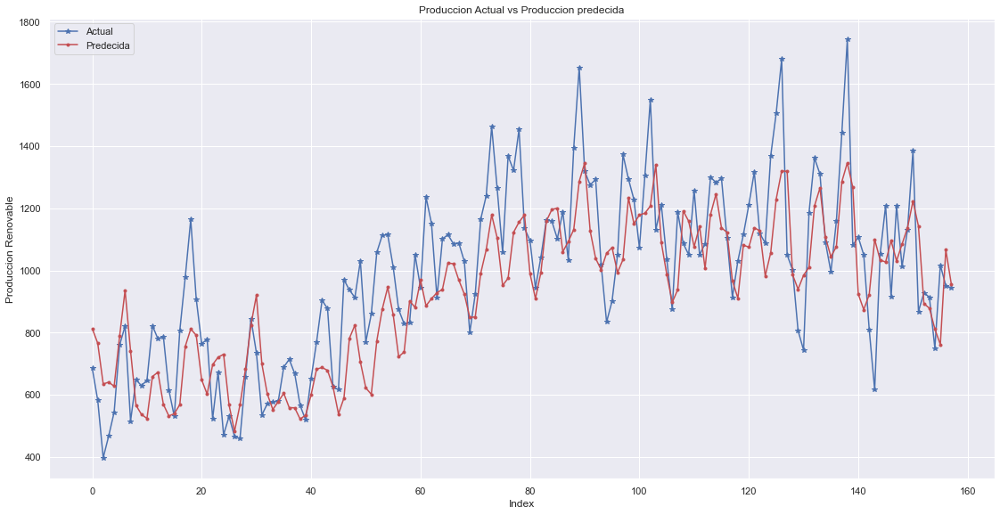

In [ ]:
plt.figure(figsize=(19, 9.5))
plt.plot(range(y_test1.size), y_test1, linestyle='-', marker='*', color='b')
plt.plot(range(ypred1.size), ypred1, linestyle='-', marker='.', color='r') 
plt.legend(['Actual','Predecida'], loc=2)
plt.title('Produccion Actual vs Produccion predecida')
plt.ylabel('Produccion Renovable')
plt.xlabel('Index')

In [ ]:
y_test1=pd.DataFrame(y_test1)
ypred1=pd.DataFrame(ypred1)

In [ ]:
error_MLP = sklearn.metrics.mean_squared_error(y_test1, ypred1)
print(error_MLP)

29289.396891773624


### - Calculo de los hiperparámetros

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
X_train_scaled = X_train
X_test_scaled = y_train

In [ ]:
print(X_val)

[[-2.64973212 -3.28485188 -1.43846891 -2.85621085  4.90352784  0.15519627]
 [-3.28485188 -1.43846891 -2.85621085  4.90352784  0.15519627  2.86254712]
 [-1.43846891 -2.85621085  4.90352784  0.15519627  2.86254712 -1.50279669]
 [-2.85621085  4.90352784  0.15519627  2.86254712 -1.50279669 -3.41527378]
 [ 4.90352784  0.15519627  2.86254712 -1.50279669 -3.41527378  1.2103623 ]
 [ 0.15519627  2.86254712 -1.50279669 -3.41527378  1.2103623   3.09687342]
 [ 2.86254712 -1.50279669 -3.41527378  1.2103623   3.09687342  2.6072066 ]
 [-1.50279669 -3.41527378  1.2103623   3.09687342  2.6072066   0.41759582]
 [-3.41527378  1.2103623   3.09687342  2.6072066   0.41759582 -5.37981748]
 [ 1.2103623   3.09687342  2.6072066   0.41759582 -5.37981748 -3.36123356]
 [ 3.09687342  2.6072066   0.41759582 -5.37981748 -3.36123356  0.79721407]
 [ 2.6072066   0.41759582 -5.37981748 -3.36123356  0.79721407  5.63874979]
 [ 0.41759582 -5.37981748 -3.36123356  0.79721407  5.63874979  2.17010936]
 [-5.37981748 -3.36123356

In [ ]:
# This returns a multi-layer-perceptron model in Keras.
def get_keras_model(num_hidden_layers, 
                    num_neurons_per_layer, 
                    dropout_rate, 
                    activation):
    # create the MLP model.
    
    # define the layers.
    inputs = tf.keras.Input(shape=(X_train_scaled.shape[1],))  # input layer.
    x = layers.Dropout(dropout_rate)(inputs) # dropout on the weights.
    
    # Add the hidden layers.
    for i in range(num_hidden_layers):
        x = layers.Dense(num_neurons_per_layer, 
                         activation=activation)(x)
        x = layers.Dropout(dropout_rate)(x)
    
    # output layer.
    outputs = layers.Dense(1, activation='linear')(x)
    
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model
    

# This function takes in the hyperparameters and returns a score (Cross validation).
def keras_mlp_cv_score(parameterization, weight=None):
    
    model = get_keras_model(parameterization.get('num_hidden_layers'),
                            parameterization.get('neurons_per_layer'),
                            parameterization.get('dropout_rate'),
                            parameterization.get('activation'))
    
    opt = parameterization.get('optimizer')
    opt = opt.lower()
    
    learning_rate = parameterization.get('learning_rate')
    
    if opt == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif opt == 'rms':
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    else:
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
    
    NUM_EPOCHS = 20
    
    # Specify the training configuration.
    model.compile(optimizer=optimizer,
                  loss=tf.keras.losses.MeanSquaredError(),
                  metrics=['mse'])

    data = X_train_scaled
    labels = y_train
    
    # fit the model using validation_data=(X_val,y_val) validation set.
    res = model.fit(data, labels, epochs=NUM_EPOCHS, batch_size=parameterization.get('batch_size'),
                    validation_data=(X_val,y_val))
    
    # look at the last 10 epochs. Get the mean and standard deviation of the validation score.
    last10_scores = np.array(res.history['val_loss'][-10:])
    mean = last10_scores.mean()
    sem = last10_scores.std()
    
    # If the model didn't converge then set a high loss.
    if np.isnan(mean):
        return 9999.0, 0.0
    
    return mean, sem

In [ ]:
# Define the search space.
parameters=[
    {
        "name": "learning_rate",
        "type": "range",
        "bounds": [0.001, 0.002],
        "log_scale": True,
    },
    {
        "name": "dropout_rate",
        "type": "range",
        "bounds": [0.01, 0.02],
        "log_scale": True,
    },
    {
        "name": "num_hidden_layers",
        "type": "range",
        "bounds": [1, 2],
        "value_type": "int"
    },
    {
        "name": "neurons_per_layer",
        "type": "range",
        "bounds": [16, 32],
        "value_type": "int"
    },
    {
        "name": "batch_size",
        "type": "choice",
        "values": [16, 32],
    },
    
    {
        "name": "activation",
        "type": "choice",
        "values": ['tanh', 'sigmoid', 'relu'],
    },
    {
        "name": "optimizer",
        "type": "choice",
        "values": ['adam', 'rms'],
    },
]

In [ ]:
# import more packages
from ax.service.ax_client import AxClient
from ax.utils.notebook.plotting import render, init_notebook_plotting

init_notebook_plotting()

ax_client = AxClient()

# create the experiment.
ax_client.create_experiment(
    name="keras_experiment",
    parameters=parameters,
    objective_name='keras_cv',
    minimize=True)

def evaluate(parameters):
    return {"keras_cv": keras_mlp_cv_score(parameters)}

[INFO 11-27 17:43:06] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


[INFO 11-27 17:43:06] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 11-27 17:43:06] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter learning_rate. If that is not the expected value type, you can explicity specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 11-27 17:43:06] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter dropout_rate. If that is not the expected value type, you can explicity specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 11-27 17:43:06] ax.service.utils.instantiation: Inferred value type of ParameterType.INT for parameter batch_size. If that is not the expected value type, you can explicity specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 11-

In [ ]:
for i in range(10):
    parameters, trial_index = ax_client.get_next_trial()
    ax_client.complete_trial(trial_index=trial_index,raw_data=evaluate(parameters))

[INFO 11-27 17:43:06] ax.service.ax_client: Generated new trial 0 with parameters {'learning_rate': 0.001764, 'dropout_rate': 0.014364, 'num_hidden_layers': 1, 'neurons_per_layer': 32, 'batch_size': 32, 'activation': 'relu', 'optimizer': 'adam'}.


Epoch 1/20
16/16 [==============================] - 1s 11ms/step - loss: 27.1261 - mse: 27.1261 - val_loss: 8.0712 - val_mse: 8.0712
Epoch 2/20
16/16 [==============================] - 0s 3ms/step - loss: 22.7254 - mse: 22.7254 - val_loss: 7.1153 - val_mse: 7.1153
Epoch 3/20
16/16 [==============================] - 0s 5ms/step - loss: 20.3337 - mse: 20.3337 - val_loss: 6.6883 - val_mse: 6.6883
Epoch 4/20
16/16 [==============================] - 0s 4ms/step - loss: 19.5092 - mse: 19.5092 - val_loss: 6.4462 - val_mse: 6.4462
Epoch 5/20
16/16 [==============================] - 0s 4ms/step - loss: 18.5347 - mse: 18.5347 - val_loss: 6.2542 - val_mse: 6.2542
Epoch 6/20
16/16 [==============================] - 0s 4ms/step - loss: 17.9205 - mse: 17.9205 - val_loss: 6.1707 - val_mse: 6.1707
Epoch 7/20
16/16 [==============================] - 0s 3ms/step - loss: 17.5590 - mse: 17.5590 - val_loss: 6.0915 - val_mse: 6.0915
Epoch 8/20
16/16 [==============================] - 0s 3ms/step - loss: 17.

[INFO 11-27 17:43:09] ax.service.ax_client: Completed trial 0 with data: {'keras_cv': (5.651595, 0.10504)}.
[INFO 11-27 17:43:09] ax.service.ax_client: Generated new trial 1 with parameters {'learning_rate': 0.001393, 'dropout_rate': 0.0124, 'num_hidden_layers': 1, 'neurons_per_layer': 30, 'batch_size': 32, 'activation': 'sigmoid', 'optimizer': 'rms'}.


Epoch 1/20
16/16 [==============================] - 1s 12ms/step - loss: 22.2651 - mse: 22.2651 - val_loss: 6.6043 - val_mse: 6.6043
Epoch 2/20
16/16 [==============================] - 0s 5ms/step - loss: 21.7056 - mse: 21.7056 - val_loss: 6.3684 - val_mse: 6.3684
Epoch 3/20
16/16 [==============================] - 0s 4ms/step - loss: 21.1677 - mse: 21.1677 - val_loss: 6.1538 - val_mse: 6.1538
Epoch 4/20
16/16 [==============================] - 0s 6ms/step - loss: 20.7078 - mse: 20.7078 - val_loss: 6.0086 - val_mse: 6.0086
Epoch 5/20
16/16 [==============================] - 0s 5ms/step - loss: 20.3042 - mse: 20.3042 - val_loss: 5.8808 - val_mse: 5.8808
Epoch 6/20
16/16 [==============================] - 0s 6ms/step - loss: 20.1495 - mse: 20.1495 - val_loss: 5.7768 - val_mse: 5.7768
Epoch 7/20
16/16 [==============================] - 0s 4ms/step - loss: 19.7981 - mse: 19.7981 - val_loss: 5.6820 - val_mse: 5.6820
Epoch 8/20
16/16 [==============================] - 0s 4ms/step - loss: 19.

[INFO 11-27 17:43:12] ax.service.ax_client: Completed trial 1 with data: {'keras_cv': (5.40907, 0.034089)}.
[INFO 11-27 17:43:12] ax.service.ax_client: Generated new trial 2 with parameters {'learning_rate': 0.001131, 'dropout_rate': 0.016277, 'num_hidden_layers': 1, 'neurons_per_layer': 31, 'batch_size': 16, 'activation': 'relu', 'optimizer': 'rms'}.


Epoch 1/20
31/31 [==============================] - 1s 9ms/step - loss: 40.5052 - mse: 40.5052 - val_loss: 11.4661 - val_mse: 11.4661
Epoch 2/20
31/31 [==============================] - 0s 3ms/step - loss: 30.7119 - mse: 30.7119 - val_loss: 8.9088 - val_mse: 8.9088
Epoch 3/20
31/31 [==============================] - 0s 3ms/step - loss: 24.7869 - mse: 24.7869 - val_loss: 7.5146 - val_mse: 7.5146
Epoch 4/20
31/31 [==============================] - 0s 3ms/step - loss: 22.3642 - mse: 22.3642 - val_loss: 6.8081 - val_mse: 6.8081
Epoch 5/20
31/31 [==============================] - 0s 3ms/step - loss: 20.2678 - mse: 20.2678 - val_loss: 6.3735 - val_mse: 6.3735
Epoch 6/20
31/31 [==============================] - 0s 3ms/step - loss: 18.9635 - mse: 18.9635 - val_loss: 6.1528 - val_mse: 6.1528
Epoch 7/20
31/31 [==============================] - 0s 3ms/step - loss: 18.1400 - mse: 18.1400 - val_loss: 6.0382 - val_mse: 6.0382
Epoch 8/20
31/31 [==============================] - 0s 3ms/step - loss: 17

[INFO 11-27 17:43:14] ax.service.ax_client: Completed trial 2 with data: {'keras_cv': (5.556107, 0.075195)}.
[INFO 11-27 17:43:14] ax.service.ax_client: Generated new trial 3 with parameters {'learning_rate': 0.001427, 'dropout_rate': 0.014028, 'num_hidden_layers': 2, 'neurons_per_layer': 17, 'batch_size': 32, 'activation': 'tanh', 'optimizer': 'adam'}.


Epoch 1/20
16/16 [==============================] - 1s 11ms/step - loss: 22.3952 - mse: 22.3952 - val_loss: 6.5948 - val_mse: 6.5948
Epoch 2/20
16/16 [==============================] - 0s 4ms/step - loss: 20.7283 - mse: 20.7283 - val_loss: 6.1347 - val_mse: 6.1347
Epoch 3/20
16/16 [==============================] - 0s 4ms/step - loss: 19.8211 - mse: 19.8211 - val_loss: 5.9481 - val_mse: 5.9481
Epoch 4/20
16/16 [==============================] - 0s 4ms/step - loss: 19.0648 - mse: 19.0648 - val_loss: 5.8433 - val_mse: 5.8433
Epoch 5/20
16/16 [==============================] - 0s 4ms/step - loss: 18.6358 - mse: 18.6358 - val_loss: 5.8374 - val_mse: 5.8374
Epoch 6/20
16/16 [==============================] - 0s 4ms/step - loss: 18.0948 - mse: 18.0948 - val_loss: 5.8672 - val_mse: 5.8672
Epoch 7/20
16/16 [==============================] - 0s 4ms/step - loss: 17.7520 - mse: 17.7520 - val_loss: 5.9823 - val_mse: 5.9823
Epoch 8/20
16/16 [==============================] - 0s 5ms/step - loss: 17.

[INFO 11-27 17:43:17] ax.service.ax_client: Completed trial 3 with data: {'keras_cv': (6.270664, 0.097678)}.
[INFO 11-27 17:43:17] ax.service.ax_client: Generated new trial 4 with parameters {'learning_rate': 0.001386, 'dropout_rate': 0.01824, 'num_hidden_layers': 2, 'neurons_per_layer': 31, 'batch_size': 16, 'activation': 'relu', 'optimizer': 'adam'}.


Epoch 1/20
31/31 [==============================] - 1s 6ms/step - loss: 25.3221 - mse: 25.3221 - val_loss: 7.3991 - val_mse: 7.3991
Epoch 2/20
31/31 [==============================] - 0s 3ms/step - loss: 20.7209 - mse: 20.7209 - val_loss: 6.6636 - val_mse: 6.6636
Epoch 3/20
31/31 [==============================] - 0s 3ms/step - loss: 19.6453 - mse: 19.6453 - val_loss: 6.2889 - val_mse: 6.2889
Epoch 4/20
31/31 [==============================] - 0s 3ms/step - loss: 18.2896 - mse: 18.2896 - val_loss: 5.9225 - val_mse: 5.9225
Epoch 5/20
31/31 [==============================] - 0s 3ms/step - loss: 17.0525 - mse: 17.0525 - val_loss: 5.7229 - val_mse: 5.7229
Epoch 6/20
31/31 [==============================] - 0s 3ms/step - loss: 16.3016 - mse: 16.3016 - val_loss: 5.5585 - val_mse: 5.5585
Epoch 7/20
31/31 [==============================] - 0s 3ms/step - loss: 15.7939 - mse: 15.7939 - val_loss: 5.5012 - val_mse: 5.5012
Epoch 8/20
31/31 [==============================] - 0s 3ms/step - loss: 15.3

[INFO 11-27 17:43:19] ax.service.ax_client: Completed trial 4 with data: {'keras_cv': (5.4878, 0.076913)}.
[INFO 11-27 17:43:19] ax.service.ax_client: Generated new trial 5 with parameters {'learning_rate': 0.001589, 'dropout_rate': 0.010338, 'num_hidden_layers': 1, 'neurons_per_layer': 31, 'batch_size': 32, 'activation': 'relu', 'optimizer': 'rms'}.


Epoch 1/20
16/16 [==============================] - 1s 14ms/step - loss: 27.0562 - mse: 27.0562 - val_loss: 7.4045 - val_mse: 7.4045
Epoch 2/20
16/16 [==============================] - 0s 4ms/step - loss: 22.8004 - mse: 22.8004 - val_loss: 6.7240 - val_mse: 6.7240
Epoch 3/20
16/16 [==============================] - 0s 4ms/step - loss: 20.5699 - mse: 20.5699 - val_loss: 6.3510 - val_mse: 6.3510
Epoch 4/20
16/16 [==============================] - 0s 4ms/step - loss: 19.7660 - mse: 19.7660 - val_loss: 6.1443 - val_mse: 6.1443
Epoch 5/20
16/16 [==============================] - 0s 5ms/step - loss: 18.5528 - mse: 18.5528 - val_loss: 5.9664 - val_mse: 5.9664
Epoch 6/20
16/16 [==============================] - 0s 6ms/step - loss: 18.0858 - mse: 18.0858 - val_loss: 5.7996 - val_mse: 5.7996
Epoch 7/20
16/16 [==============================] - 0s 5ms/step - loss: 17.7096 - mse: 17.7096 - val_loss: 5.6470 - val_mse: 5.6470
Epoch 8/20
16/16 [==============================] - 0s 5ms/step - loss: 17.

[INFO 11-27 17:43:22] ax.service.ax_client: Completed trial 5 with data: {'keras_cv': (5.307848, 0.04521)}.
[INFO 11-27 17:43:22] ax.service.ax_client: Generated new trial 6 with parameters {'learning_rate': 0.001671, 'dropout_rate': 0.017041, 'num_hidden_layers': 1, 'neurons_per_layer': 22, 'batch_size': 16, 'activation': 'relu', 'optimizer': 'rms'}.


Epoch 1/20
31/31 [==============================] - 1s 7ms/step - loss: 26.7244 - mse: 26.7244 - val_loss: 7.8876 - val_mse: 7.8876
Epoch 2/20
31/31 [==============================] - 0s 2ms/step - loss: 22.2016 - mse: 22.2016 - val_loss: 7.0698 - val_mse: 7.0698
Epoch 3/20
31/31 [==============================] - 0s 3ms/step - loss: 20.1545 - mse: 20.1545 - val_loss: 6.6250 - val_mse: 6.6250
Epoch 4/20
31/31 [==============================] - 0s 2ms/step - loss: 19.0740 - mse: 19.0740 - val_loss: 6.4505 - val_mse: 6.4505
Epoch 5/20
31/31 [==============================] - 0s 3ms/step - loss: 18.8709 - mse: 18.8709 - val_loss: 6.3166 - val_mse: 6.3166
Epoch 6/20
31/31 [==============================] - 0s 3ms/step - loss: 18.7140 - mse: 18.7140 - val_loss: 6.1971 - val_mse: 6.1971
Epoch 7/20
31/31 [==============================] - 0s 3ms/step - loss: 18.3766 - mse: 18.3766 - val_loss: 6.1076 - val_mse: 6.1076
Epoch 8/20
31/31 [==============================] - 0s 2ms/step - loss: 17.5

[INFO 11-27 17:43:24] ax.service.ax_client: Completed trial 6 with data: {'keras_cv': (5.853584, 0.04285)}.
[INFO 11-27 17:43:24] ax.service.ax_client: Generated new trial 7 with parameters {'learning_rate': 0.001488, 'dropout_rate': 0.013713, 'num_hidden_layers': 1, 'neurons_per_layer': 27, 'batch_size': 16, 'activation': 'relu', 'optimizer': 'adam'}.


Epoch 1/20
31/31 [==============================] - 1s 7ms/step - loss: 28.6399 - mse: 28.6399 - val_loss: 7.7549 - val_mse: 7.7549
Epoch 2/20
31/31 [==============================] - 0s 2ms/step - loss: 22.7671 - mse: 22.7671 - val_loss: 6.5325 - val_mse: 6.5325
Epoch 3/20
31/31 [==============================] - 0s 3ms/step - loss: 20.4677 - mse: 20.4677 - val_loss: 6.0917 - val_mse: 6.0917
Epoch 4/20
31/31 [==============================] - 0s 3ms/step - loss: 18.9435 - mse: 18.9435 - val_loss: 5.8984 - val_mse: 5.8984
Epoch 5/20
31/31 [==============================] - 0s 3ms/step - loss: 18.2642 - mse: 18.2642 - val_loss: 5.8149 - val_mse: 5.8149
Epoch 6/20
31/31 [==============================] - 0s 2ms/step - loss: 18.0538 - mse: 18.0538 - val_loss: 5.7558 - val_mse: 5.7558
Epoch 7/20
31/31 [==============================] - 0s 2ms/step - loss: 17.5792 - mse: 17.5792 - val_loss: 5.7522 - val_mse: 5.7522
Epoch 8/20
31/31 [==============================] - 0s 3ms/step - loss: 17.7

[INFO 11-27 17:43:27] ax.service.ax_client: Completed trial 7 with data: {'keras_cv': (5.66249, 0.022414)}.
[INFO 11-27 17:43:27] ax.service.ax_client: Generated new trial 8 with parameters {'learning_rate': 0.001808, 'dropout_rate': 0.019878, 'num_hidden_layers': 2, 'neurons_per_layer': 29, 'batch_size': 16, 'activation': 'sigmoid', 'optimizer': 'adam'}.


Epoch 1/20
31/31 [==============================] - 1s 8ms/step - loss: 24.5052 - mse: 24.5052 - val_loss: 7.8141 - val_mse: 7.8141
Epoch 2/20
31/31 [==============================] - 0s 3ms/step - loss: 23.3612 - mse: 23.3612 - val_loss: 7.1699 - val_mse: 7.1699
Epoch 3/20
31/31 [==============================] - 0s 3ms/step - loss: 22.1048 - mse: 22.1048 - val_loss: 6.4898 - val_mse: 6.4898
Epoch 4/20
31/31 [==============================] - 0s 4ms/step - loss: 20.6112 - mse: 20.6112 - val_loss: 5.9638 - val_mse: 5.9638
Epoch 5/20
31/31 [==============================] - 0s 5ms/step - loss: 19.7944 - mse: 19.7944 - val_loss: 5.7142 - val_mse: 5.7142
Epoch 6/20
31/31 [==============================] - 0s 4ms/step - loss: 19.1259 - mse: 19.1259 - val_loss: 5.6225 - val_mse: 5.6225
Epoch 7/20
31/31 [==============================] - 0s 4ms/step - loss: 18.6849 - mse: 18.6849 - val_loss: 5.6477 - val_mse: 5.6477
Epoch 8/20
31/31 [==============================] - 0s 5ms/step - loss: 18.3

[INFO 11-27 17:43:30] ax.service.ax_client: Completed trial 8 with data: {'keras_cv': (5.547592, 0.03846)}.
[INFO 11-27 17:43:30] ax.service.ax_client: Generated new trial 9 with parameters {'learning_rate': 0.001216, 'dropout_rate': 0.01887, 'num_hidden_layers': 2, 'neurons_per_layer': 27, 'batch_size': 16, 'activation': 'sigmoid', 'optimizer': 'rms'}.


Epoch 1/20
31/31 [==============================] - 1s 8ms/step - loss: 24.4332 - mse: 24.4332 - val_loss: 7.9656 - val_mse: 7.9656
Epoch 2/20
31/31 [==============================] - 0s 3ms/step - loss: 23.6080 - mse: 23.6080 - val_loss: 7.4544 - val_mse: 7.4544
Epoch 3/20
31/31 [==============================] - 0s 3ms/step - loss: 22.8714 - mse: 22.8714 - val_loss: 6.9835 - val_mse: 6.9835
Epoch 4/20
31/31 [==============================] - 0s 3ms/step - loss: 21.6862 - mse: 21.6862 - val_loss: 6.5382 - val_mse: 6.5382
Epoch 5/20
31/31 [==============================] - 0s 3ms/step - loss: 21.1462 - mse: 21.1462 - val_loss: 6.1664 - val_mse: 6.1664
Epoch 6/20
31/31 [==============================] - 0s 3ms/step - loss: 20.4873 - mse: 20.4873 - val_loss: 5.9011 - val_mse: 5.9011
Epoch 7/20
31/31 [==============================] - 0s 4ms/step - loss: 19.7786 - mse: 19.7786 - val_loss: 5.7101 - val_mse: 5.7101
Epoch 8/20
31/31 [==============================] - 0s 4ms/step - loss: 19.4

[INFO 11-27 17:43:33] ax.service.ax_client: Completed trial 9 with data: {'keras_cv': (5.556032, 0.019156)}.


In [ ]:
ax_client.get_trials_data_frame().sort_values('trial_index')

,keras_cv,trial_index,arm_name,learning_rate,dropout_rate,num_hidden_layers,neurons_per_layer,batch_size,activation,optimizer,trial_status,generation_method
0,5.651595,0,0_0,0.001764,0.014364,1,32,32,relu,adam,COMPLETED,Sobol
1,5.409070,1,1_0,0.001393,0.012400,1,30,32,sigmoid,rms,COMPLETED,Sobol
2,5.556107,2,2_0,0.001131,0.016277,1,31,16,relu,rms,COMPLETED,Sobol
3,6.270664,3,3_0,0.001427,0.014028,2,17,32,tanh,adam,COMPLETED,Sobol
4,5.487800,4,4_0,0.001386,0.018240,2,31,16,relu,adam,COMPLETED,Sobol
5,5.307848,5,5_0,0.001589,0.010338,1,31,32,relu,rms,COMPLETED,Sobol
6,5.853584,6,6_0,0.001671,0.017041,1,22,16,relu,rms,COMPLETED,Sobol
7,5.662490,7,7_0,0.001488,0.013713,1,27,16,relu,adam,COMPLETED,Sobol
8,5.547592,8,8_0,0.001808,0.019878,2,29,16,sigmoid,adam,COMPLETED,Sobol
9,5.556032,9,9_0,0.001216,0.018870,2,27,16,sigmoid,rms,COMPLETED,Sobol


In [ ]:
best_parameters, values = ax_client.get_best_parameters()

# the best set of parameters.
for k in best_parameters.items():
  print(k)

print()

# the best score achieved.
means, covariances = values
print(means)

('learning_rate', 0.0015887994547596285)
('dropout_rate', 0.01033841893913357)
('num_hidden_layers', 1)
('neurons_per_layer', 31)
('batch_size', 32)
('activation', 'relu')
('optimizer', 'rms')

{'keras_cv': 5.307848024368286}


### - Modelos mas complejos

In [ ]:
input_layer = keras.layers.Input(shape=X_train.shape[1:])
hidden1 = keras.layers.Dense(16,activation="relu")(input_layer)
hidden2 = keras.layers.Dense(4,activation="relu")(hidden1)
#hidden3 = keras.layers.Dense(8,activation="relu")(hidden2)
#dropout_layer = keras.layers.Dropout(0.2)(hidden3)
#output_layer = keras.layers.Dense(1, activation='linear')(dropout_layer)
output_layer = keras.layers.Dense(1, activation='linear')(hidden2)

In [ ]:
ts_model=keras.Model(inputs=[input_layer],outputs=[output_layer])
ts_model.summary()

Model: "model_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_17 (InputLayer)       [(None, 12)]              0         
                                                                 
 dense_38 (Dense)            (None, 16)                208       
                                                                 
 dense_39 (Dense)            (None, 4)                 68        
                                                                 
 dense_40 (Dense)            (None, 1)                 5         
                                                                 
Total params: 281
Trainable params: 281
Non-trainable params: 0
_________________________________________________________________


In [ ]:
ts_model.compile(loss="mean_squared_error",optimizer="adam")
history=ts_model.fit(X_train,y_train,epochs=150,batch_size=16,validation_data=(X_val,y_val))

Epoch 1/150
31/31 [==============================] - 1s 6ms/step - loss: 502.4268 - val_loss: 322.6109
Epoch 2/150
31/31 [==============================] - 0s 3ms/step - loss: 188.8191 - val_loss: 77.8607
Epoch 3/150
31/31 [==============================] - 0s 2ms/step - loss: 40.0831 - val_loss: 9.3791
Epoch 4/150
31/31 [==============================] - 0s 9ms/step - loss: 21.9656 - val_loss: 9.2084
Epoch 5/150
31/31 [==============================] - 0s 6ms/step - loss: 21.2466 - val_loss: 8.9710
Epoch 6/150
31/31 [==============================] - 0s 5ms/step - loss: 20.9427 - val_loss: 8.8362
Epoch 7/150
31/31 [==============================] - 0s 5ms/step - loss: 20.6648 - val_loss: 8.7333
Epoch 8/150
31/31 [==============================] - 0s 3ms/step - loss: 20.4461 - val_loss: 8.6642
Epoch 9/150
31/31 [==============================] - 0s 4ms/step - loss: 20.1038 - val_loss: 8.3403
Epoch 10/150
31/31 [==============================] - 0s 4ms/step - loss: 19.6247 - val_loss: 8

<AxesSubplot: >

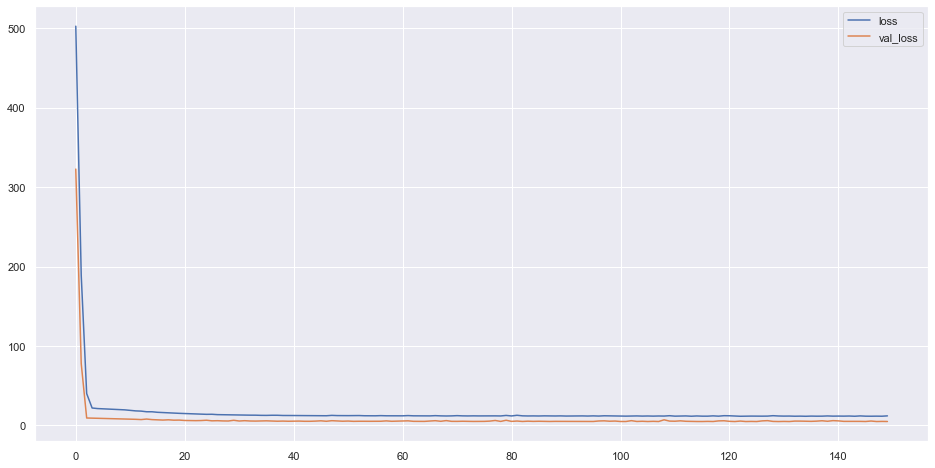

In [ ]:
pd.DataFrame(history.history).plot(figsize=(16,8))

In [ ]:
mse_test1=ts_model.evaluate(X_test,y_test)

5/5 [==============================] - 0s 3ms/step - loss: 3.5866


In [ ]:
print(mse_test1)

3.5866189002990723


In [ ]:
preds_ts_model=ts_model.predict(X_test)
print(preds_ts_model)

5/5 [==============================] - 0s 2ms/step
[[27.542414]
 [27.370483]
 [25.392511]
 [23.908577]
 [25.226316]
 [27.542982]
 [28.965248]
 [27.164686]
 [25.127836]
 [23.550669]
 [24.039423]
 [26.122608]
 [26.51525 ]
 [24.606846]
 [23.721613]
 [23.839727]
 [24.20159 ]
 [27.602962]
 [28.142826]
 [27.45726 ]
 [26.471943]
 [24.978947]
 [26.649296]
 [26.858995]
 [26.777943]
 [24.532467]
 [23.236155]
 [23.7748  ]
 [25.297602]
 [28.086014]
 [29.439465]
 [26.83874 ]
 [25.174122]
 [23.731672]
 [24.767159]
 [25.01211 ]
 [24.19791 ]
 [24.02026 ]
 [23.376629]
 [23.787645]
 [24.989697]
 [26.713623]
 [26.498125]
 [26.013056]
 [25.814976]
 [24.332853]
 [24.733212]
 [27.541092]
 [28.19842 ]
 [26.490126]
 [25.839552]
 [25.469019]
 [27.315798]
 [29.230371]
 [29.65159 ]
 [28.629429]
 [26.984608]
 [27.383492]
 [29.018303]
 [29.105062]
 [30.02237 ]
 [29.024818]
 [29.114508]
 [30.311274]
 [30.062147]
 [30.692068]
 [31.097841]
 [30.469881]
 [29.26326 ]
 [28.818554]
 [28.28867 ]
 [29.488382]
 [31.405252]


Text(0.5, 0, 'Index')

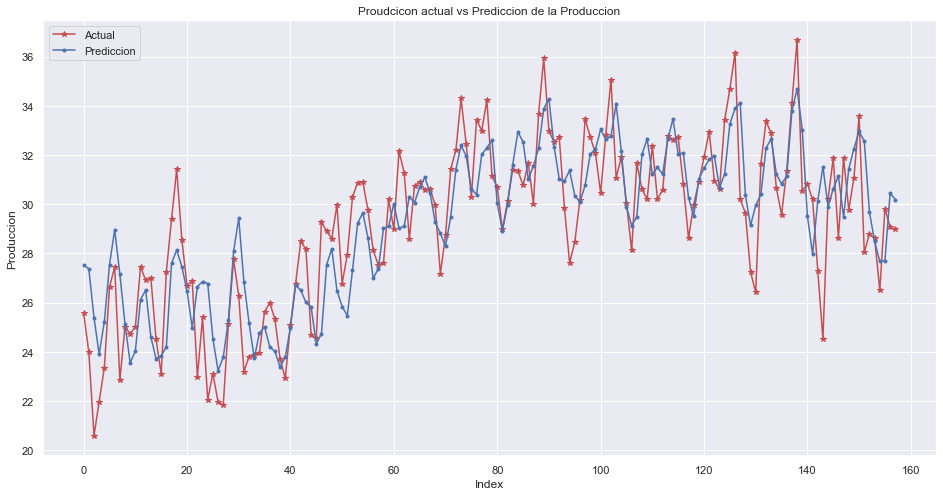

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(range(y_test.size), y_test, linestyle='-', marker='*', color='r')
plt.plot(range(preds_ts_model.size), preds_ts_model, linestyle='-', marker='.', color='b') 
plt.legend(['Actual','Prediccion'], loc=2)
plt.title('Proudcicon actual vs Prediccion de la Produccion')
plt.ylabel('Produccion')
plt.xlabel('Index')

Text(0.5, 0, 'Index')

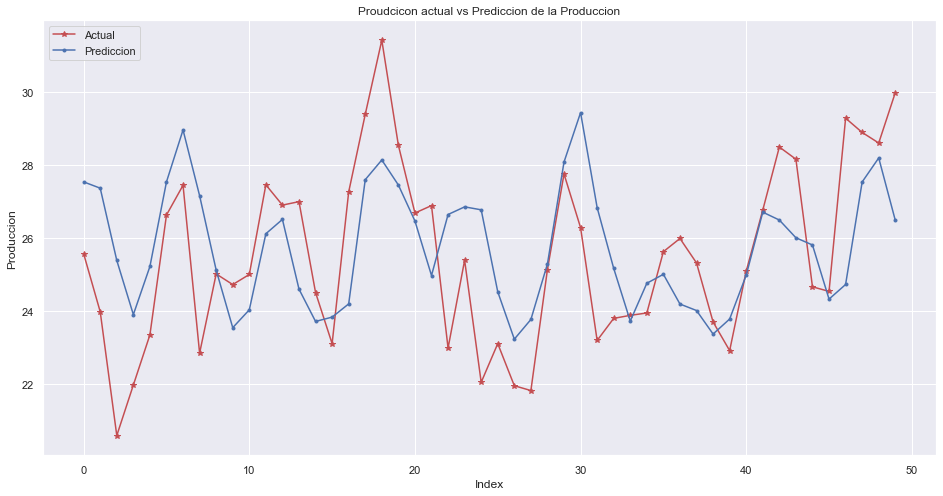

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(range(50), y_test[0:50], linestyle='-', marker='*', color='r')
plt.plot(range(50), preds_ts_model[0:50], linestyle='-', marker='.', color='b') 
plt.legend(['Actual','Prediccion'], loc=2)
plt.title('Proudcicon actual vs Prediccion de la Produccion')
plt.ylabel('Produccion')
plt.xlabel('Index')

In [ ]:
# Error cuadratico medio de predicción de red neuronal #
print(mse_test1)

3.5866189002990723


In [ ]:
ypred1=sp.special.inv_boxcox(np.array(ypred[0:]),0.3531163186031495)
y_test1=sp.special.inv_boxcox(np.array(y_test[0:]),0.3531163186031495)
y_train1=sp.special.inv_boxcox(np.array(y_train[0:]),0.3531163186031495)

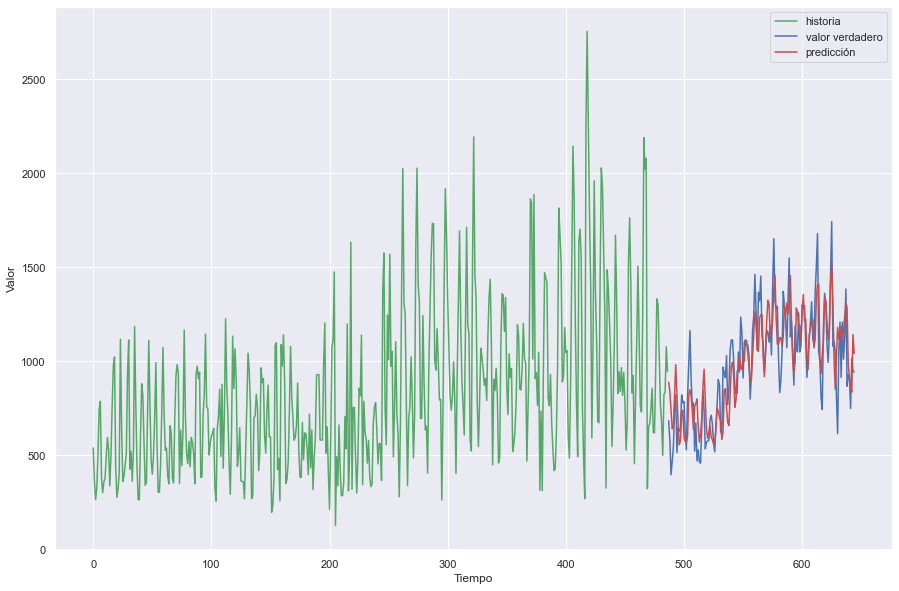

In [ ]:
plt.plot(np.arange(0, len(y_train1)), y_train1, 'g', label="historia")
plt.plot(np.arange(len(y_train1), len(y_train1) + len(y_test1)), y_test1, label="valor verdadero")
plt.plot(np.arange(len(y_train1), len(y_train1) + len(y_test1)), ypred1, 'r', label="predicción")
plt.ylabel('Valor')
plt.xlabel('Tiempo')
plt.legend()
plt.show();

Text(0.5, 0, 'Index')

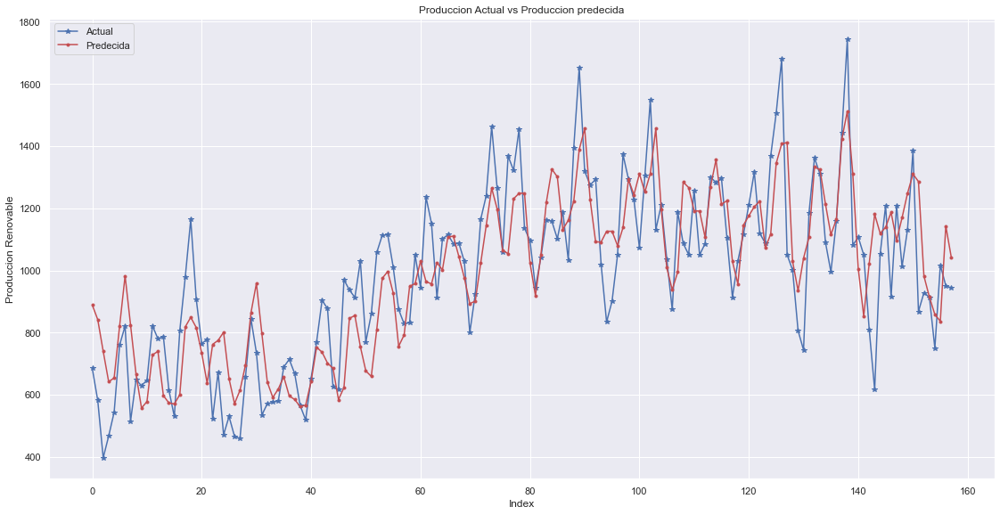

In [ ]:
plt.figure(figsize=(19, 9.5))
plt.plot(range(y_test1.size), y_test1, linestyle='-', marker='*', color='b')
plt.plot(range(ypred1.size), ypred1, linestyle='-', marker='.', color='r') 
plt.legend(['Actual','Predecida'], loc=2)
plt.title('Produccion Actual vs Produccion predecida')
plt.ylabel('Produccion Renovable')
plt.xlabel('Index')

In [ ]:
y_test1=pd.DataFrame(y_test1)
ypred1=pd.DataFrame(ypred1)

In [ ]:
error_MC = sklearn.metrics.mean_squared_error(y_test1, ypred1)
print(error_MC)

26242.395228665977


## - Redes recurrentes

### - LSTM

In [ ]:
Produccion = pd.read_excel("produccion de cafe mensual (1).xlsx",header=0,
                       names=["Fecha","Produccion"])
Produccion=Produccion.set_index('Fecha')
Produccion_ts = Produccion['Produccion'] # Creación de la serie de tiempo 

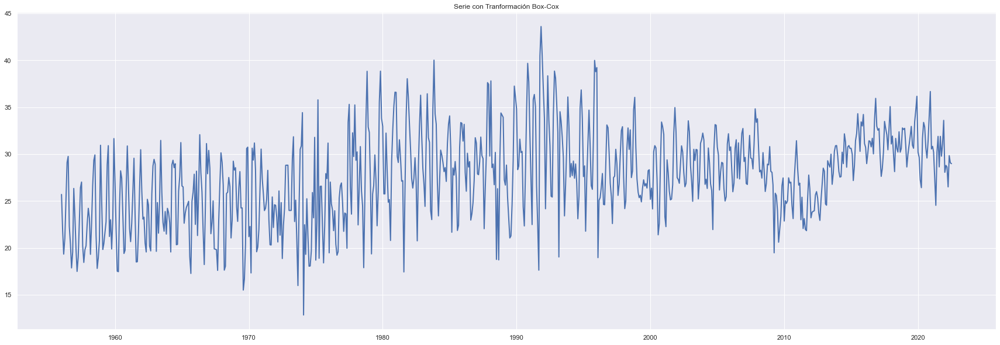

In [ ]:
box=sp.stats.boxcox(Produccion['Produccion'],lmbda= 0.3531163186031495)
data = Produccion.assign(box=box)  

box_produccionts= data['box'] 
plt.plot(box_produccionts,linewidth= 2)
plt.title('Serie con Tranformación Box-Cox') 
plt.show() 

In [ ]:
#crea un dataset 
#
df1 = pd.DataFrame(Produccion.values, columns=['serie'])
# crea el objeto  scaler y escala los datos
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df1.values)
#
dataset = pd.DataFrame(scaled_data,index=df1.index, columns=['serie'])
#

In [ ]:
train_size = int(len(dataset) * 0.8)
test_size = len(dataset) - train_size
train, test = dataset.iloc[0:train_size], dataset.iloc[train_size:len(df1)]
len_train = len(train)
len_test = len(test)
print(len_train, len_test)

639 160


In [ ]:
def create_dataset(X, y, time_steps=1):
    # crea dos listas vacias para depositar los datos
    Xs, ys = [], []
    # el primer lote de datos empieza en la primera observación
    # y toma time_steps  datos.
    # Comienza a avanzar hacia adelante.
    for i in range(len(X) - time_steps):
        v = X.iloc[i:(i + time_steps)].values
        Xs.append(v)
        ys.append(y.iloc[i + time_steps])
    return np.array(Xs), np.array(ys)

In [ ]:
time_steps = 24

# reshape to [samples, time_steps, n_features]

X_train, y_train = create_dataset(train, train, time_steps)
X_test, y_test = create_dataset(test, test, time_steps)

print(X_train.shape, y_train.shape)

print([X_train[0:2,], y_train[0:2]])

(615, 24, 1) (615, 1)
[array([[[0.21537291],
        [0.12709285],
        [0.08066971],
        [0.11035008],
        [0.19672755],
        [0.31468798],
        [0.33599696],
        [0.13584475],
        [0.09893455],
        [0.05783866],
        [0.08447489],
        [0.23249619],
        [0.15715373],
        [0.08866058],
        [0.05251142],
        [0.07534247],
        [0.14307458],
        [0.2347793 ],
        [0.25152207],
        [0.09550989],
        [0.06659056],
        [0.08828006],
        [0.09589041],
        [0.13964992]],

       [[0.12709285],
        [0.08066971],
        [0.11035008],
        [0.19672755],
        [0.31468798],
        [0.33599696],
        [0.13584475],
        [0.09893455],
        [0.05783866],
        [0.08447489],
        [0.23249619],
        [0.15715373],
        [0.08866058],
        [0.05251142],
        [0.07534247],
        [0.14307458],
        [0.2347793 ],
        [0.25152207],
        [0.09550989],
        [0.06659056],
       

In [ ]:
print(X_train.shape)
print(y_train.shape)
from sklearn.preprocessing import MinMaxScaler

(615, 24, 1)
(615, 1)


In [ ]:
# shapes
inputs_shape = (X_train.shape[1], X_train.shape[2])
lstm_output = 64

# layers
inputs = Input(inputs_shape)
x = LSTM(units=lstm_output, name='LSTM_layer')(inputs)
outputs = Dense(1)(x)

# model
serie_0_1_model = Model(inputs=inputs, outputs=outputs, name='series_LSTM_model')

In [ ]:
inputs_shape

(24, 1)

In [ ]:
serie_0_1_model.summary()

Model: "series_LSTM_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_20 (InputLayer)       [(None, 24, 1)]           0         
                                                                 
 LSTM_layer (LSTM)           (None, 64)                16896     
                                                                 
 dense_43 (Dense)            (None, 1)                 65        
                                                                 
Total params: 16,961
Trainable params: 16,961
Non-trainable params: 0
_________________________________________________________________


In [ ]:
lstm_output =64
input_size =1 # input size in the LSTM machine
#
# cada entrada de tamaño 50 es mostrada a la máquina  LSTM machine uno por uno.
# luego se tiene
#
num_params = 4*(lstm_output*lstm_output + lstm_output*input_size+ lstm_output)
num_params

16896

In [ ]:
serie_0_1_model.compile(loss='mean_squared_error',
  optimizer=Adam(0.001)
)

In [ ]:
history = serie_0_1_model.fit(
    X_train, y_train,
    epochs=33,
    batch_size=16,
    validation_split=0.1,
    verbose=1,
    shuffle=True
)

Epoch 1/33
35/35 [==============================] - 3s 24ms/step - loss: 0.0290 - val_loss: 0.0067
Epoch 2/33
35/35 [==============================] - 1s 15ms/step - loss: 0.0205 - val_loss: 0.0070
Epoch 3/33
35/35 [==============================] - 1s 20ms/step - loss: 0.0202 - val_loss: 0.0069
Epoch 4/33
35/35 [==============================] - 0s 14ms/step - loss: 0.0199 - val_loss: 0.0065
Epoch 5/33
35/35 [==============================] - 0s 11ms/step - loss: 0.0195 - val_loss: 0.0072
Epoch 6/33
35/35 [==============================] - 0s 11ms/step - loss: 0.0192 - val_loss: 0.0075
Epoch 7/33
35/35 [==============================] - 0s 13ms/step - loss: 0.0192 - val_loss: 0.0060
Epoch 8/33
35/35 [==============================] - 0s 11ms/step - loss: 0.0177 - val_loss: 0.0075
Epoch 9/33
35/35 [==============================] - 0s 14ms/step - loss: 0.0180 - val_loss: 0.0056
Epoch 10/33
35/35 [==============================] - 0s 13ms/step - loss: 0.0165 - val_loss: 0.0061
Epoch 11/

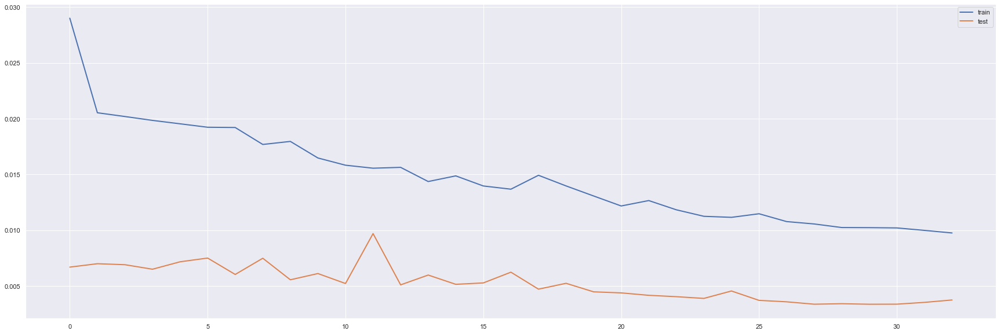

In [ ]:
plt.plot(history.history['loss'], linewidth= 2, label='train')
plt.plot(history.history['val_loss'], linewidth= 2, label='test')
plt.legend();

In [ ]:
y_pred =serie_0_1_model.predict(X_test)

5/5 [==============================] - 1s 5ms/step


In [ ]:
y_pred.shape

(136, 1)

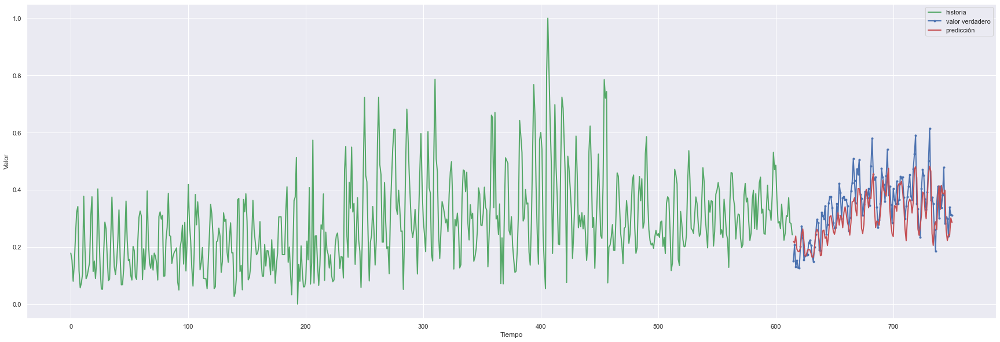

In [ ]:
plt.plot(np.arange(0, len(y_train)), y_train, 'g', linewidth= 2,label="historia")
plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_test, marker='.', linewidth= 2,label="valor verdadero")
plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_pred, 'r',linewidth= 2, label="predicción")
plt.ylabel('Valor')
plt.xlabel('Tiempo')
plt.legend()
plt.show();

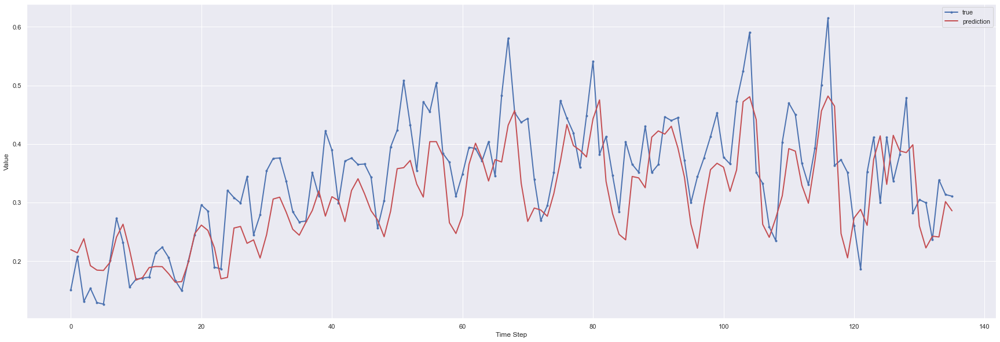

In [ ]:
plt.plot(y_test, marker='.', linewidth= 2,label="true")
plt.plot(y_pred, 'r', linewidth= 2,label="prediction")
plt.ylabel('Value')
plt.xlabel('Time Step')
plt.legend()
plt.show();

In [ ]:
scaled_data = scaler.fit_transform(df1.values)
dataset = pd.DataFrame(scaled_data)
dataset.columns = ['sine']
dataset.index = df1.index

In [ ]:
y_pred = scaler.inverse_transform(y_pred)

In [ ]:
y_test = scaler.inverse_transform(y_test.reshape(-1,1))

In [ ]:
y_test.shape

(136, 1)

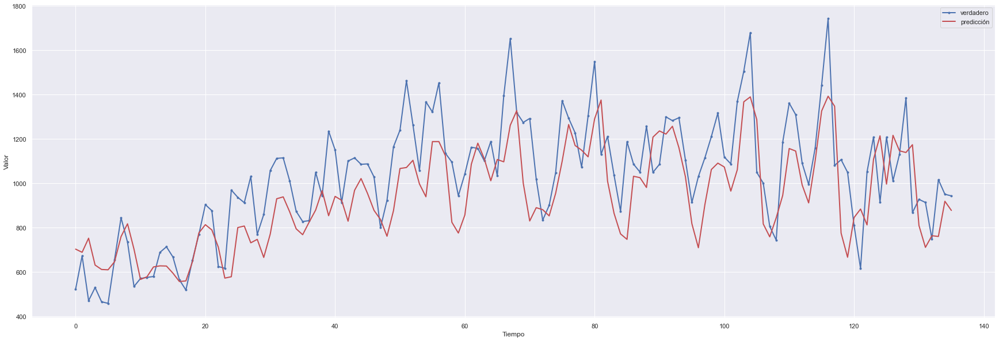

In [ ]:
plt.plot(y_test, marker='.', linewidth= 2,label="verdadero")
plt.plot(y_pred, 'r', linewidth= 2,label="predicción")
plt.ylabel('Valor')
plt.xlabel('Tiempo')
plt.legend()
plt.show();

In [ ]:
from sklearn.metrics import mean_squared_error
error_LSTM = sklearn.metrics.mean_squared_error(y_test, y_pred)
print(error_LSTM)

35806.16125922206


In [ ]:
RLSTM=y_test-y_pred

### - Modelos GRU

In [ ]:
# shapes
inputs_shape = (X_train.shape[1], X_train.shape[2])
lstm_output = 64

# layers
inputs = Input(inputs_shape)
x = GRU(units=lstm_output, name='GRU_layer')(inputs)
outputs = Dense(1)(x)

# model
serie_0_1_model_gru = Model(inputs=inputs, outputs=outputs, name='series_LSTM_model')


# summary
serie_0_1_model_gru.summary()

plot_model(serie_0_1_model_gru, to_file='../Imagenes/series_LSTM_model.png', 
           show_shapes=True)

Model: "series_LSTM_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_21 (InputLayer)       [(None, 24, 1)]           0         
                                                                 
 GRU_layer (GRU)             (None, 64)                12864     
                                                                 
 dense_44 (Dense)            (None, 1)                 65        
                                                                 
Total params: 12,929
Trainable params: 12,929
Non-trainable params: 0
_________________________________________________________________
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [ ]:
# compila
serie_0_1_model_gru.compile(loss='mean_squared_error',
  optimizer=Adam(0.001)
)

In [ ]:
# entrena
history = serie_0_1_model_gru.fit(
    X_train, y_train,
    epochs=30,
    batch_size=16,
    validation_split=0.1,
    verbose=1,
    shuffle=False
)

Epoch 1/30
35/35 [==============================] - 3s 26ms/step - loss: 0.0226 - val_loss: 0.0060
Epoch 2/30
35/35 [==============================] - 0s 13ms/step - loss: 0.0213 - val_loss: 0.0058
Epoch 3/30
35/35 [==============================] - 0s 13ms/step - loss: 0.0217 - val_loss: 0.0092
Epoch 4/30
35/35 [==============================] - 0s 12ms/step - loss: 0.0215 - val_loss: 0.0080
Epoch 5/30
35/35 [==============================] - 0s 12ms/step - loss: 0.0201 - val_loss: 0.0067
Epoch 6/30
35/35 [==============================] - 0s 12ms/step - loss: 0.0185 - val_loss: 0.0059
Epoch 7/30
35/35 [==============================] - 0s 12ms/step - loss: 0.0174 - val_loss: 0.0057
Epoch 8/30
35/35 [==============================] - 0s 14ms/step - loss: 0.0166 - val_loss: 0.0058
Epoch 9/30
35/35 [==============================] - 0s 14ms/step - loss: 0.0158 - val_loss: 0.0058
Epoch 10/30
35/35 [==============================] - 0s 12ms/step - loss: 0.0151 - val_loss: 0.0053
Epoch 11/

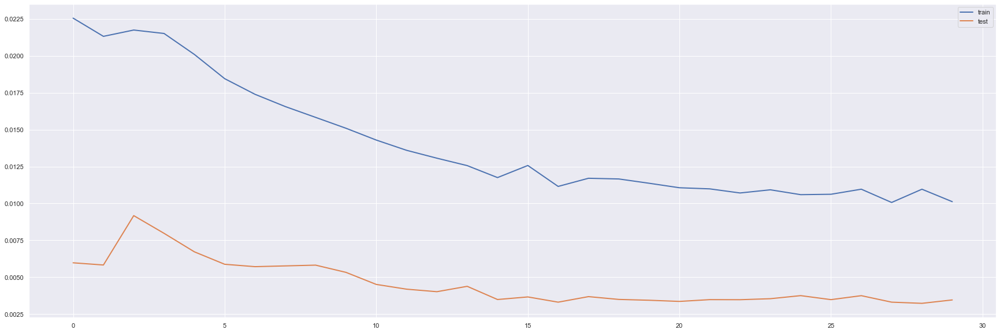

In [ ]:
plt.plot(history.history['loss'],linewidth= 2, label='train')
plt.plot(history.history['val_loss'],linewidth= 2, label='test')
plt.legend();

In [ ]:
y_pred_gru =serie_0_1_model_gru.predict(X_test)
# escala original
y_pred_gru = scaler.inverse_transform(y_pred_gru)

5/5 [==============================] - 0s 4ms/step


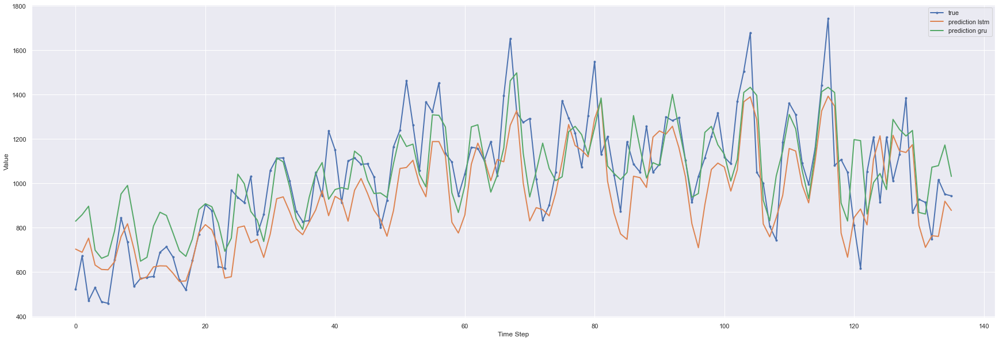

In [ ]:
plt.plot(y_test,linestyle="-",linewidth= 2, marker='.', label="true")
plt.plot(y_pred,linestyle="-",linewidth= 2, label="prediction lstm")
plt.plot(y_pred_gru,linestyle="-" ,linewidth= 2,  label="prediction gru")
plt.ylabel('Value')
plt.xlabel('Time Step')
plt.legend()
plt.show();

In [ ]:
from sklearn.metrics import mean_squared_error
error_GRU = sklearn.metrics.mean_squared_error(y_test, y_pred_gru)
print(error_GRU)

31553.454643694247


In [ ]:
RGRU=y_test-y_pred_gru

# 5.Error cuadratico

In [ ]:
import statistics as stats


## Error cuadratico medio de predicción de suavizamiento exponencial
print("Suavisamiento exponencial",errorR,"\n")

## Error cuadratico medio de predicción árbol de decisión
print("Árbol de decisión",stats.mean((ObsvsPred11["observado"][632:798] - ObsvsPred11["Predicción"][632:798])**2),"\n")

# Error cuadratico medio de predicción de red neuronal (MLP) #
print("MLP",error_MLP,"\n",mse_test,"\n")


# Error cuadratico medio de predicción de red neuronal modelos mas complejos#
print("Modelos más complejos",error_MC,"\n",mse_test1,"\n")

# Error cuadratico medio de predicción de red recurrente LSTM#
print("red recurrente LSTM",error_LSTM,"\n")

# Error cuadratico medio de predicción de red recurrente GRU#
print("red recurrente GRU",error_GRU,"\n")

Suavisamiento exponencial 29513.593655079498 

Árbol de decisión 59182.4901452226 

MLP 29289.396891773624 
 4.1124491691589355 

Modelos más complejos 26242.395228665977 
 3.5866189002990723 

red recurrente LSTM 35806.16125922206 

red recurrente GRU 31553.454643694247 



# 6.Residuales

## Suavizamiento Exponencial

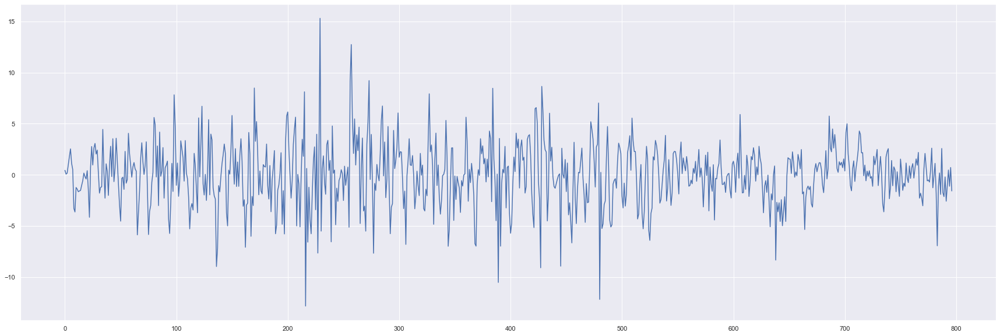

In [ ]:
plt.plot(modelo.resid)

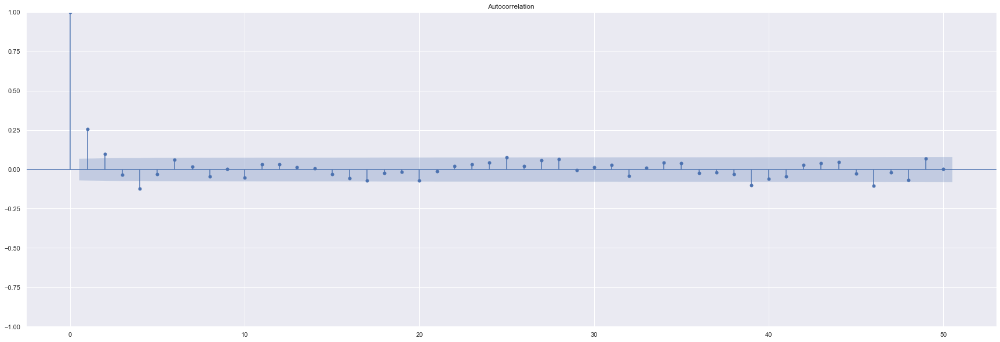

In [ ]:
acfres=plot_acf(modelo.resid, adjusted=False, lags=50)

## SARIMA

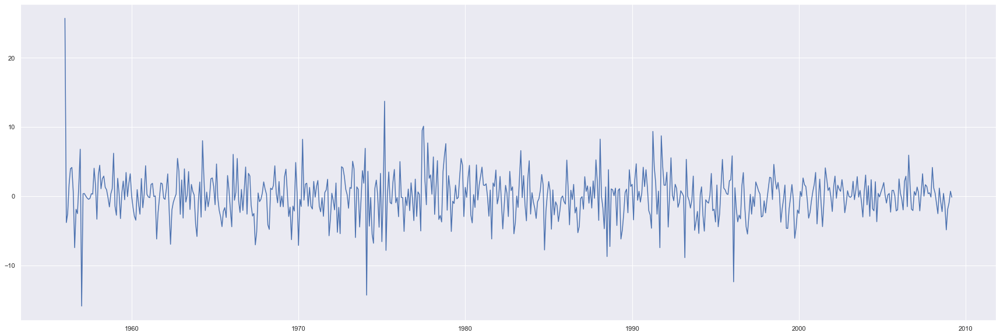

In [ ]:
plt.plot(residuales)

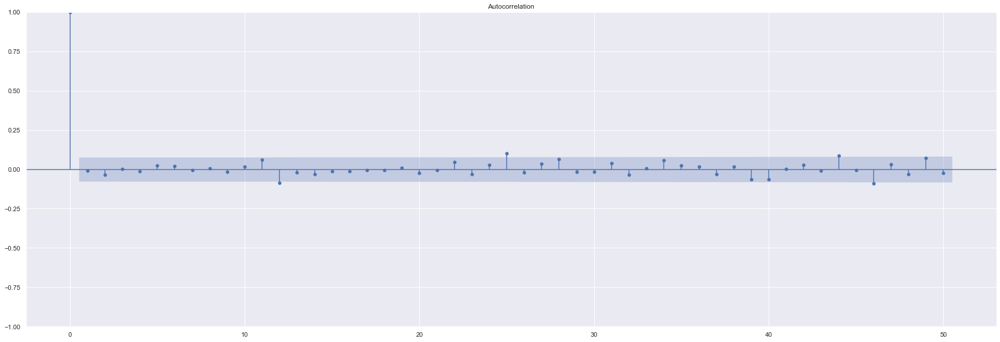

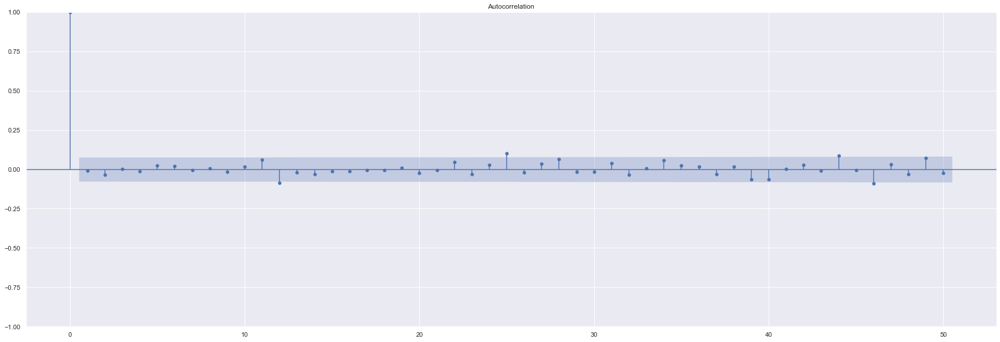

In [ ]:
plot_acf(residuales, adjusted=False, lags=50)

## Árbol de decisión

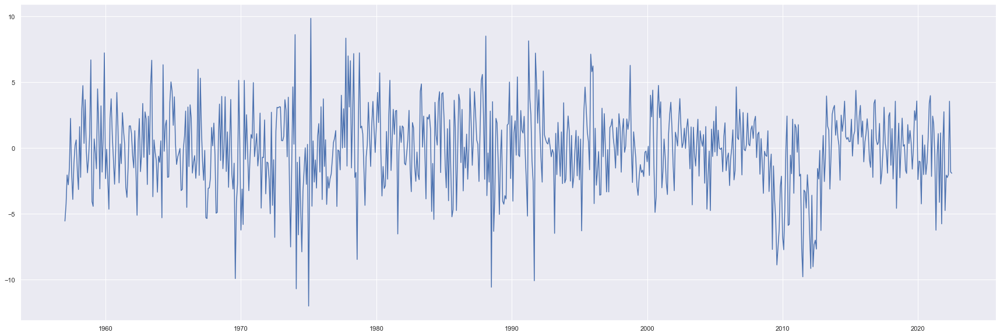

In [ ]:
ResiArbol=(ObsvsPred["observado"] - ObsvsPred["Predicción"])
plt.plot(ResiArbol)

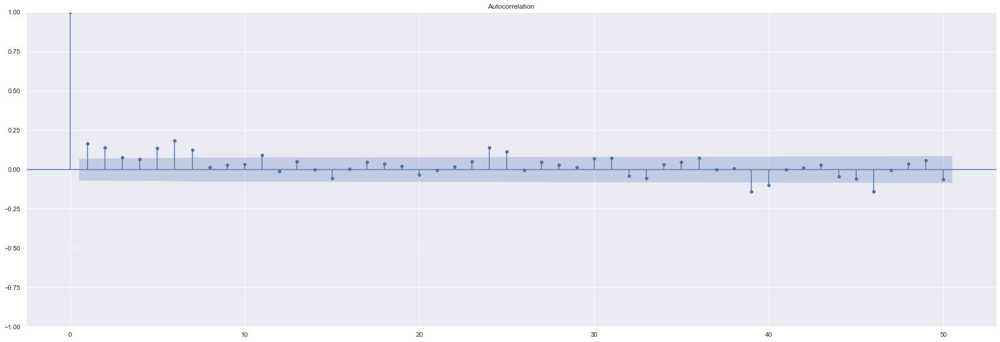

In [ ]:
acfresA=plot_acf(ResiArbol, adjusted=False, lags=50)

## MLP

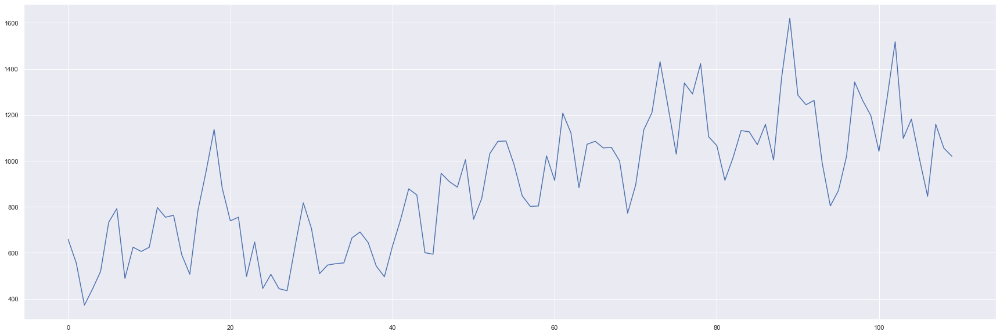

In [ ]:
RMLP=y_test1[0:110]-ypred[0:110]
plt.plot(RMLP)

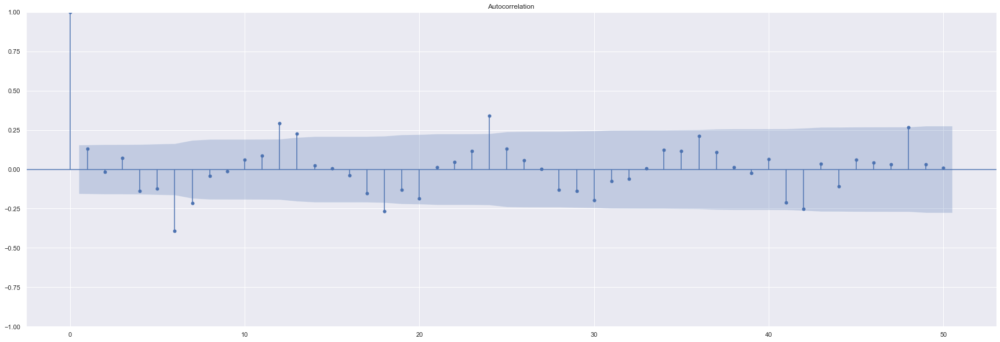

In [ ]:
acfresA=plot_acf(RMLP, adjusted=False, lags=50)

## Modelos más complejos

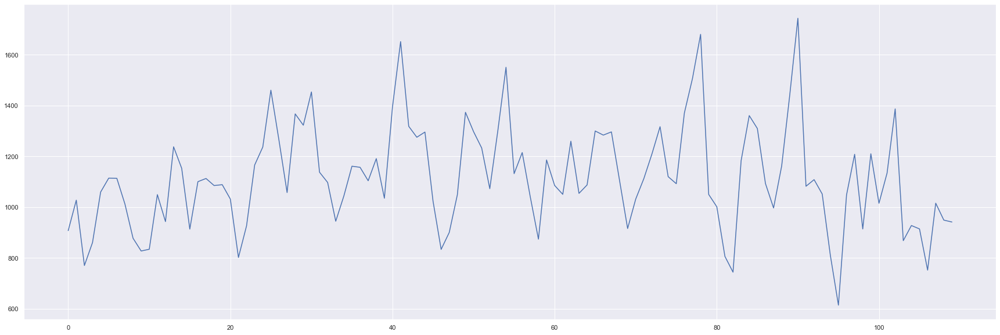

In [ ]:
RMLC=y_test[0:110]-preds_ts_model[0:110]
plt.plot(RMLC)

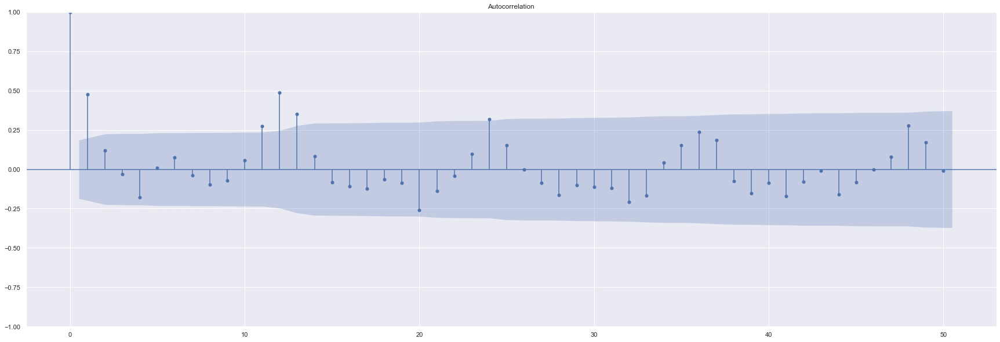

In [ ]:
acfresA=plot_acf(RMLC, adjusted=False, lags=50)

## LSTM

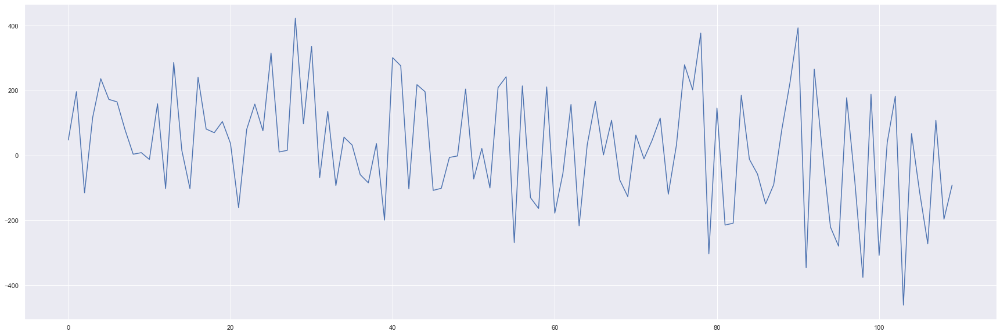

In [ ]:
plt.plot(RLSTM)

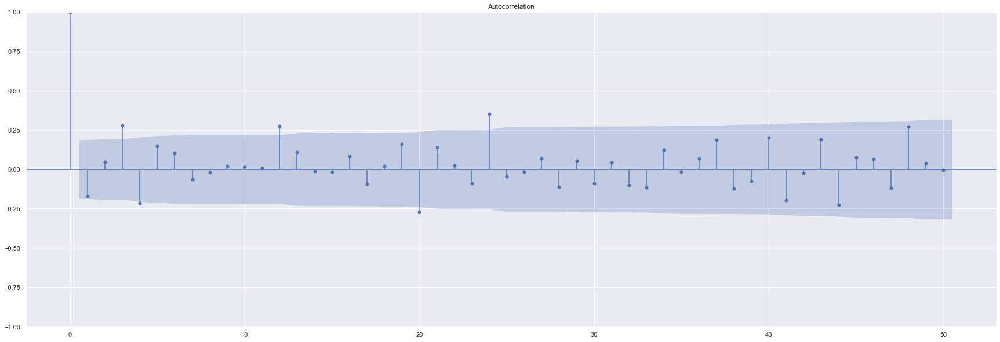

In [ ]:
acfresA=plot_acf(RLSTM, adjusted=False, lags=50)

## GRU

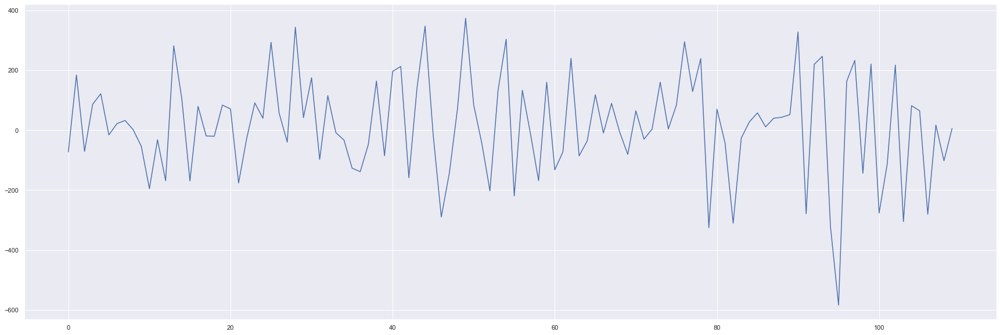

In [ ]:
plt.plot(RGRU)

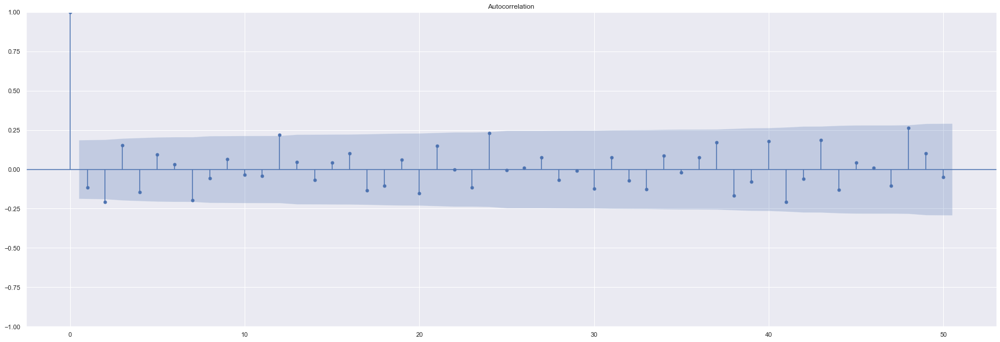

In [ ]:
acfresA=plot_acf(RGRU, adjusted=False, lags=50)

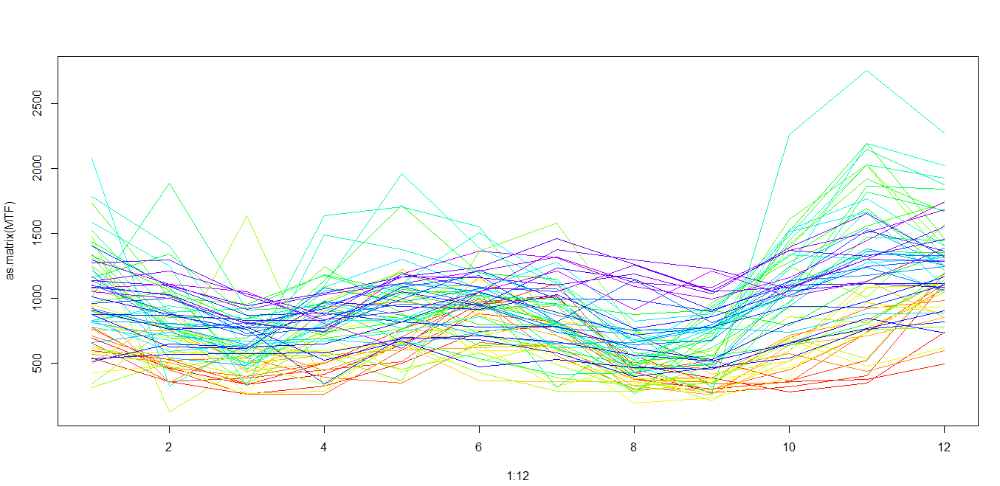

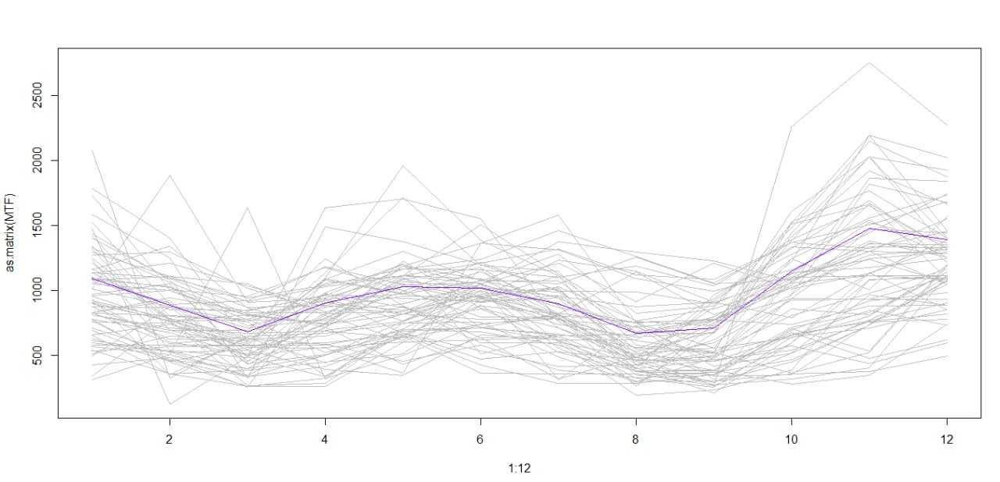

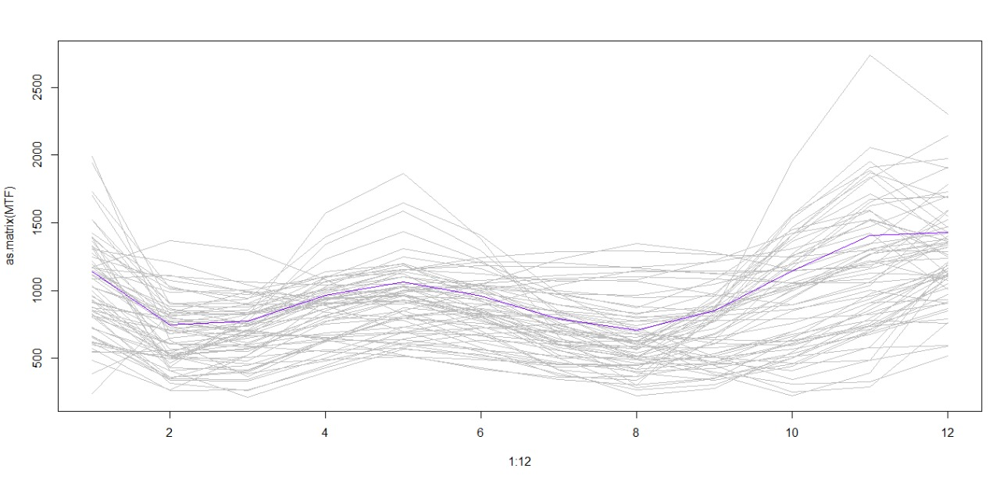